---
안녕하세요 고목나무와 매미팀입니다 <br>
저희 프로젝트는 최근 화두가 되고 있는 **서울시 지하철역의 공실문제**를 4차산업시대에 맞게 스마트하고 친환경적으로 해결하고자 하는 데에서 출발했습니다<br>
아직 부족하지만 재미있게 읽어주시고 피드백이나 궁금한 사항들 댓글 남겨주시면 감사하겠습니다 :)

---

# 목차

**Intro: 들어가며**
    
**0. 라이브러리 및 데이터 불러오기** <br>
    
**1. 데이터 전처리** <br>
* 1.1 활용 데이터 
* 1.2 데이터 전처리
* 1.3 EDA

**2. 분석 프로세스** <br>
* 2.1 파생변수 생성 
* 2.2 Data Scaling
* 2.3 Clustering 
* 2.4 분석결과 요약
    
**3. 분석결과 및 군집별 대시보드** <br>
* 3.1 분석결과 해석
* 3.2 샐러드볼지수
* 3.3 군집별 대시보드
    
**4. 업무 활용 방안** <br>
* 4.1 공실 양극화 및 서울교통공사 적자 해소 
* 4.2 농산물 가격 변동폭 축소 및 안정적 공급
* 4.3 정책 활용 
* 4.4 고용 및 교육 프로그램 증대 
    
**5. 유형별 스마트팜 추천 입지** <br>
* 5.1 보급형 스마트팜 추천 입지
* 5.2 유통형 스마트팜 추천 입지
* 5.3 생산형 스마트팜 추천 입지
    
**6. 참고자료**    

# Intro: 들어가며
## <font size = 4><span style="color:#81B622">*'상가에 입주할 사람이 없어...'*</font>

계속되는 코로나 유행으로 서울 지하철역 내 상권의 경기가 쉽게 회복되지 않으면서, 지하상가 내 공실 문제가 더욱 심화되었습니다. 공실이 늘어나면서 발생하는 손실도 더욱 늘어만 가는 실정으로, 이러한 문제를 타개하기 위한 방안으로 최근 몇몇 역사 내 들어선 메트로팜에서 영감을 얻어 주제를 선정하게 되었습니다.저희 팀은 서울교통공사, 서울시민, 소상공인 관점에서 해당 주제에 접근했습니다.

<br>

현재 서울교통공사와 시민들, 소상공인이 직면한 <span style="color: Purple">**문제점**</span>은 다음 3가지 사항이 있습니다. <br>
    
* **서울시 역사 내 공실 양극화**
  * 코로나19의 여파로 서울 지하철역 지하상권의 경기가 쉽사리 회복되지 않고 있음
  * 입점 경쟁이 치열해 빈 가게가 하나도 없는 곳이 있는 반면, 빈 가게가 늘어나면서 그늘진 곳도 존재하는 실태
  * 2021년 3월 31일 기준 서울 지하철역 내 1600개 상가 중 공실은 391곳(**공실률 약 24.4%**)
  * 2020년 기준 서울 지하철 상가 공실로 발생한 **예상 손실 규모는 연 20억원** 가량 
  <br>
  <br>
* **농축산물 가격의 큰 변동성과 기상영향**
  * 농산물의 작황 및 생산량이 일정하지 않고, 가격의 등락도 반복되어 소비자인 국민의 안정적 먹거리 확보에 많은 어려움이 있음
  * <span style="color:#81B622">**'파테크'**</span>라는 신조어가 생길 정도로 농산물 시세의 변동성이 큰 실태
  * 농축수산물 가격은 전년대비 **9.7% 상승**했으며 농산물 가격 상승이 재료비 인상으로 이어지며 **서비스 가격도 1.7% 상승**하는 **연쇄적 인플레이션**을 초래
  * 작년 장마와 태풍, 올해 초 폭설 및 한파 등 기상요건에 의해 작황이 부진했던 것이 큰 영향 <br>
<br>
* **수요 대비 복잡한 유통구조과 큰 유통비용률**
  * 서울특별시는 전국에서 가장 인구가 많으면서 인구밀도가 높은 도시로 전국에서 농산물 소비량 또한 최대인 도시지만, 복잡한 유통구조와 높은 유통비용이 발생하는 실태
  * 생산자로부터 **직접** 공급하는 소비자는 겨우 **4.4%**
  * 생산자에서 소비자로 유통되는 과정에서 발생하는 **유통비용률**은 **47.5%**

<br>
다음과 같은 문제를 해결하고자 서울시 지하철 유동인구, 지하상가 임대정보, 소상공인 상가정보를 활용하여 분석하였습니다.


---

## 0. 라이브러리 및 데이터 불러오기

In [712]:
# 필요 패키지 불러오기
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pyecharts
from pyecharts import *
from datetime import datetime
from IPython.display import Image
from pyecharts import Line
from pyecharts import Bar
from pyecharts import online
online()
import warnings
warnings.filterwarnings('ignore')

# Clustering
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans

#Scaling
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

# for interactive visualizations
import geopandas as gpd
plt.rcParams['font.family'] = 'NanumGothic'
from sklearn.metrics import silhouette_samples, silhouette_score

# for Space visualization
from IPython.display import display
from IPython.display import HTML
import geopandas as gpd
import fiona   # 공간데이터를 딕셔너리 형태 등으로 접근할 수 있는 라이브러리
import pyproj
from fiona.crs import from_epsg

In [4]:
# Raw_Data 불러오기
file_subway_onoff = '서울시 지하철 호선별 역별 시간대별 승하차 인원 정보.csv'
file_subway_rent = "서울교통공사_지하상가임대정보_20210531.csv"
file_smartfarm = '서울교통공사_스마트팜 설치현황_20200930.csv'
file_store = "소상공인시장진흥공단_상가(상권)정보_서울_202106.csv"
file_subway = "서울교통공사_도시철도역사정보_20210409_1618459845117_52128.csv"
file_Nationwide_subway = "전국도시철도역사정보표준데이터.csv"

---

# 1. 데이터 전처리 및 통합데이터 생성

## 1.1 활용 데이터
   * 전국도시철도 역사정보 표준데이터
   <br>https://www.data.go.kr/data/15013205/standard.do 
   * 서울시 지하철 호선별 역별 시간대별 승하차 인원 정보
   <br>https://data.seoul.go.kr/dataList/7/literacyView.do
   * 지하상가 임대정보
   <br>https://www.data.go.kr/data/15071329/fileData.do
   * 소상공인 상가정보
   <br>https://golmok.seoul.go.kr/regionAreaAnalysis.do
   * 서울교통공사 스마트팜 설치현황
   <br>https://www.data.go.kr/data/15044456/fileData.do#tab-layer-file

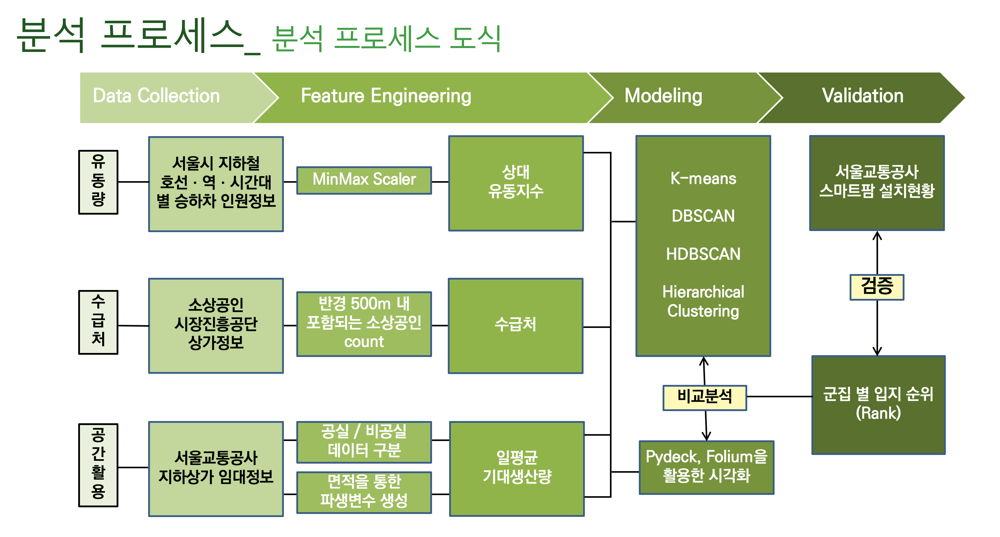

In [522]:
# 활용 데이터 및 분석 프로세스 소개
Image("analysis process.png")

## 1.2 데이터 전처리

### 1.2.1 전국도시철도역사정보표준데이터
전국도시철도역사정보데이터에서 서울시 지하철 역사명과 역위경도를 사용하고자 데이터를 불러왔습니다.

In [6]:
# 데이터 불러오기
Nationwide_subway = pd.read_csv(file_Nationwide_subway, encoding = 'euc-kr')

In [7]:
Nationwide_subway.head()

,역번호,역사명,노선번호,노선명,영문역사명,한자역사명,환승역구분,환승노선번호,환승노선명,역위도,역경도,운영기관명,역사도로명주소,역사전화번호,데이터기준일자,제공기관코드,제공기관명
0,3122,부평삼거리,S2801,인천지하철 1호선,Bupyeongsamgeori,富平三거리,일반역,-,-,37.478267,126.710494,인천교통공사,인천광역시 부평구 경인로 765,032-516-3122,2020-11-30,B551894,인천교통공사
1,3123,간석오거리,S2801,인천지하철 1호선,Ganseogogeori,間石五거리,일반역,-,-,37.466921,126.707861,인천교통공사,인천광역시 남동구 경인로 674,032-434-3123,2020-11-30,B551894,인천교통공사
2,3124,인천시청,S2801,인천지하철 1호선,Incheon City Hall,仁川市廳,일반역,-,-,37.457615,126.702216,인천교통공사,인천광역시 남동구 예술로 264,032-441-3124,2020-11-30,B551894,인천교통공사
3,3125,예술회관,S2801,인천지하철 1호선,Arts Center,藝術會館,일반역,-,-,37.449334,126.700991,인천교통공사,인천광역시 남동구 예술로 172,032-441-3125,2020-11-30,B551894,인천교통공사
4,3126,인천터미널,S2801,인천지하철 1호선,Incheon Bus Terminal,仁川터미널,일반역,-,-,37.441917,126.699727,인천교통공사,인천광역시 미추홀구 예술로 85,032-441-3126,2020-11-30,B551894,인천교통공사


In [8]:
# 필요 컬럼만 추출
nat_subway = Nationwide_subway[["역사명", "역위도", "역경도","역사도로명주소"]].copy()
# 결측치 확인
nat_subway.isnull().sum()

역사명         0
역위도         0
역경도         0
역사도로명주소    29
dtype: int64

In [9]:
# 역사도로명주소가 결측치인 행 확인
nat_subway[nat_subway['역사도로명주소'].isnull()]

,역사명,역위도,역경도,역사도로명주소
1015,가양역,37.563176,126.854437,NaN
1016,가오리역,37.641644,127.016799,NaN
1017,개화역,37.578583,126.797482,NaN
1018,공항시장역,37.562554,126.808686,NaN
1019,구반포역,37.501601,126.987470,NaN
1020,국회의사당역,37.528332,126.917875,NaN
1021,노들역,37.513005,126.954082,NaN
1022,등촌역,37.551386,126.864492,NaN
1023,마곡나루역,37.566932,126.827329,NaN
1024,북한산보국문역,37.612437,127.008079,NaN


#### 전처리 1. 결측치 확인
역사도로명주소가 결측치인 데이터를 확인한 결과 **9호선, 북한산우이신설선**에 해당하는 역 데이터인 것을 확인했습니다. <br>
해당 역들은 모두 역사도로명주소가 서울시 인것을 확인한 후 역사도로명주소에 **서울**을 입력하여 주었습니다.

In [10]:
# 9호선, 우이신설선 도로명주소 서울로 입력
nat_subway["역사도로명주소"].fillna("서울", inplace = True)

In [11]:
# 역사도로명주소가 서울인 데이터만 추출
seoul_subway = nat_subway[nat_subway.역사도로명주소.str.contains('서울')].reset_index(drop=True)
seoul_subway

,역사명,역위도,역경도,역사도로명주소
0,동대문역사문화공원,37.565003,127.007394,서울특별시 중구 을지로 지하 279 (을지로7가)
1,신당,37.565829,127.018102,서울특별시 중구 퇴계로 지하 431-1 (신당동)
2,상왕십리,37.564171,127.029352,서울특별시 성동구 왕십리로 지하 374 (하왕십리동)
3,왕십리,37.561525,127.037508,서울특별시 성동구 왕십리로 지하300(행당동)
4,한양대,37.555222,127.043492,서울특별시 성동구 왕십리로 206 (행당동)
...,...,...,...,...
356,북한산우이역,37.663031,127.012752,서울
357,염창역,37.548701,126.874590,서울
358,정릉역,37.609220,127.014022,서울
359,4.19민주묘지역,37.652203,127.013537,서울


역사도로명주소기준 서울에 해당하는 역들에 대한 분석을 실시하고자 서울시내에 있는 역들만 추출했습니다.

#### 전처리 2. 역명 전처리 함수 생성
이후 다른 데이터와의 역사명을 통일시켜주어야 하기 때문에 이를 간편히 할 수 있는 함수를 만들었습니다.
<br>preprocess_subway_name 함수를 사용하여 앞으로 모든 데이터의 역명을 통일시켜줍니다.


* 역사명 뒤에 괄호가 붙는 경우<br>
<span style="color:#7F7F7F"> ex. 서울역(경의선) -> 서울역 <br>
* 역사명에 '역'이 붙는 경우와 아닌 경우<br>
    <span style="color:#7F7F7F"> ex. 강남 -> 강남역

In [12]:
# 함수 생성
def preprocess_subway_name(data, col):
    data[col] = data[col].replace('\([^)]*\)',"",regex=True)
    data[col] = data[col].str.replace(" ", "")
    data[col] = data[col].str.rstrip("역")
    data[col]+="역"

In [13]:
# 역사명 통일시켜주기
preprocess_subway_name(seoul_subway,'역사명')

In [14]:
seoul_subway

,역사명,역위도,역경도,역사도로명주소
0,동대문역사문화공원역,37.565003,127.007394,서울특별시 중구 을지로 지하 279 (을지로7가)
1,신당역,37.565829,127.018102,서울특별시 중구 퇴계로 지하 431-1 (신당동)
2,상왕십리역,37.564171,127.029352,서울특별시 성동구 왕십리로 지하 374 (하왕십리동)
3,왕십리역,37.561525,127.037508,서울특별시 성동구 왕십리로 지하300(행당동)
4,한양대역,37.555222,127.043492,서울특별시 성동구 왕십리로 206 (행당동)
...,...,...,...,...
356,북한산우이역,37.663031,127.012752,서울
357,염창역,37.548701,126.874590,서울
358,정릉역,37.609220,127.014022,서울
359,4.19민주묘지역,37.652203,127.013537,서울


#### 전처리 3. 동일 역명 및 환승역 처리
seoul_subway 데이터에서 전처리해야 할 주요사항으로 **중복역과 환승역**이 있었습니다.

<br>환승역은 역위경도 값이 호선수 만큼 나오기 때문에 해당 역의 위경도의 평균값을 사용했습니다.
<br>중복역은 4호선 이수(총신대입구)역 같은 경우 같은 역이지만 다른 행에 표기된 경우입니다. 중복을 피하고자 같은 역에 해당하는 역들에 대해 전처리를 진행했습니다.

In [15]:
# 유니크한 역사명 개수 확인
len(seoul_subway['역사명'].unique())

296

In [16]:
# 동일역이지만 다르게 표기된 역 확인
seoul_subway[(seoul_subway['역사명']=='이수역')|(seoul_subway['역사명']=='총신대입구역')]

,역사명,역위도,역경도,역사도로명주소
177,총신대입구역,37.486782,126.981945,서울특별시 동작구 동작대로 지하 117 (사당동)
295,이수역,37.486582,126.981745,서울특별시 동작구 사당로 지하310 (사당동)


In [17]:
# 이수,총신대입구 위경도 평균
이수위경도 = seoul_subway[(seoul_subway['역사명']=='이수')|(seoul_subway['역사명']=='총신대입구')].mean()
seoul_subway.loc[295,['역위도','역경도']] = 이수위경도

# 총신대입구 drop
seoul_subway.drop(177,inplace=True)
seoul_subway.reset_index(drop=True,inplace=True)

In [18]:
# 유니크한 역사명 개수 확인
len(seoul_subway['역사명'].unique())

295

In [19]:
# 환승역 확인
transfer = seoul_subway.groupby(['역사명']).count()
transfer[transfer['역위도']>1].index

Index(['가락시장역', '가산디지털단지역', '강남구청역', '건대입구역', '고속터미널역', '공덕역', '교대역', '군자역',
       '김포공항역', '까치산역', '노원역', '대림역', '도곡역', '도봉산역', '동대문역', '동대문역사문화공원역',
       '동묘앞역', '디지털미디어시티역', '불광역', '사당역', '삼각지역', '상봉역', '서울역', '석계역', '석촌역',
       '선릉역', '선정릉역', '수서역', '시청역', '신길역', '신내역', '신당역', '신도림역', '신설동역', '신촌역',
       '약수역', '연신내역', '영등포구청역', '오금역', '옥수역', '온수역', '올림픽공원역', '왕십리역',
       '을지로3가역', '을지로4가역', '이촌역', '잠실역', '종로3가역', '종합운동장역', '창동역', '천호역',
       '청구역', '청량리역', '충무로역', '충정로역', '태릉입구역', '합정역', '홍대입구역', '효창공원앞역'],
      dtype='object', name='역사명')

In [20]:
# 환승역 위경도 평균
seoul_subway = seoul_subway.groupby("역사명",as_index = False).mean()
seoul_subway

,역사명,역위도,역경도
0,4.19민주묘지역,37.652203,127.013537
1,가락시장역,37.492844,127.117987
2,가산디지털단지역,37.481393,126.882605
3,가양역,37.563176,126.854437
4,가오리역,37.641644,127.016799
...,...,...,...
290,화랑대역,37.620131,127.084426
291,회기역,37.589802,127.057936
292,회현역,37.558517,126.978130
293,효창공원앞역,37.539416,126.961355


서울시내에 있는 역의 개수는 최종 295개로 집계가 되었습니다.

### 1.2.2 서울시 지하철 호선별 역별 시간대별 승하차 인원 정보
서울시 지하철 유동인구에 대한 분석을 진행하고자 다음 데이터를 활용했습니다.

In [21]:
# 데이터 읽기
subway_onoff = pd.read_csv(file_subway_onoff, encoding = 'euc-kr')
subway_onoff

,사용월,호선명,지하철역,04시-05시 승차인원,04시-05시 하차인원,05시-06시 승차인원,05시-06시 하차인원,06시-07시 승차인원,06시-07시 하차인원,07시-08시 승차인원,...,23시-24시 하차인원,00시-01시 승차인원,00시-01시 하차인원,01시-02시 승차인원,01시-02시 하차인원,02시-03시 승차인원,02시-03시 하차인원,03시-04시 승차인원,03시-04시 하차인원,작업일자
0,202106,1호선,동대문,715,14,13235,2131,8936,6979,14776,...,8211,16,1434,1,1,0,0,0,0,20210703
1,202106,1호선,동묘앞,51,1,3218,1100,3422,4802,5896,...,2589,4,1348,0,0,0,0,0,0,20210703
2,202106,1호선,서울역,654,17,9008,6400,12474,37203,37253,...,8024,30,637,0,1,0,0,0,0,20210703
3,202106,1호선,시청,37,0,1881,4340,2948,21443,6280,...,1485,3,92,0,0,0,0,0,0,20210703
4,202106,1호선,신설동,343,3,8150,3192,8131,10929,17021,...,5451,10,449,0,0,0,0,0,0,20210703
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45333,201501,중앙선,운길산,0,0,177,56,642,403,1292,...,633,3,222,0,0,0,0,0,0,20151223
45334,201501,중앙선,원덕,1,0,292,4,415,46,537,...,383,3,157,0,0,0,0,0,0,20151223
45335,201501,중앙선,중랑,14,1,4929,424,8539,2084,22160,...,6501,86,1617,0,0,0,0,0,0,20151223
45336,201501,중앙선,팔당,0,0,161,50,368,149,1227,...,336,8,85,0,0,0,0,0,0,20151223


#### 전처리 1. 컬럼 전처리
* 사용하는 컬럼 걸러내기
* seoul_subway 데이터와 컬럼명을 통일했습니다
<br><span style="color:#7F7F7F"> ex. 지하철역 -> 역사명 <br>
* 코로나 전후 2개년, 총 4개년 데이터를 사용했습니다. (18년-21년)


In [22]:
# 필요없는 컬럼 제거
subway_onoff.drop(columns='작업일자',inplace=True)

# 2021년 7월까지 코로나 전후로 2개년씩 총 4개년 데이터 사용
subway_onoff = subway_onoff[subway_onoff['사용월']>=201806]

In [23]:
# 컬럼명 통일
subway_onoff.rename(columns={'지하철역':'역사명'},inplace=True)

In [24]:
# 지하철 역별 전체 sum 확인
subway_onoff.groupby(['역사명','호선명']).sum()

사용월  04시-05시 승차인원  04시-05시 하차인원  05시-06시 승차인원  \
역사명       호선명                                                        
4.19민주묘지  우이신설선  7472240           287            79         48025   
가능        경원선    7472240         14637           234        289083   
가락시장      3호선    7472240           458            14         96968   
          8호선    7472240           686            10         95463   
가산디지털단지   7호선    7472240         24628           122        281906   
...                  ...           ...           ...           ...   
회룡        경원선    7472240         36942           757        511740   
회현(남대문시장) 4호선    7472240          1545            41         80017   
효창공원앞     6호선    7472240           209             4         87130   
          경의선    7472240           120             4         23338   
흑석(중앙대입구) 9호선    7472240           309            13        120884   

                 05시-06시 하차인원  06시-07시 승차인원  06시-07시 하차인원  07시-08시 승차인원  \
역사명       호선명                                                             
4.19민주묘지  우이신설선          9529        108311         36950        268600   
가능        경원선           62379        453432        164143        897192   
가락시장      3호선           23116        260797        192653        768506   
          8호선           82515        182674        229078        360318   
가산디지털단지   7호선          193865        332377        795296        733890   
...                       ...           ...           ...           ...   
회룡        경원선           73378        932027        231369       2077640   
회현(남대문시장) 4호선           32677        133288        794810        209357   
효창공원앞     6호선           22330        179330        150577        558609   
          경의선            8141         65441         75007        161919   
흑석(중앙대입구) 9호선           35906        207201        212654        587704   

                 07시-08시 하차인원  08시-09시 승차인원  ...  23시-24시 승차인원  23시-24시 하차인원  \
역사명       호선명                                ...                               
4.19민주묘지  우이신설선         59037        306223  ...         19366         86384   
가능        경원선          187830        844945  ...         51616        247432   
가락시장      3호선          379309        891859  ...         95557        237750   
          8호선          476250        482638  ...        141881        170735   
가산디지털단지   7호선         3811485        832658  ...        500330        258965   
...                       ...           ...  ...           ...           ...   
회룡        경원선          281574       1703791  ...         60529        450165   
회현(남대문시장) 4호선         1936441        335816  ...        196433        157984   
효창공원앞     6호선          252188        905837  ...         80515        175561   
          경의선          155959        223591  ...         36819         82298   
흑석(중앙대입구) 9호선          405684        773695  ...        173413        296835   

                 00시-01시 승차인원  00시-01시 하차인원  01시-02시 승차인원  01시-02시 하차인원  \
역사명       호선명                                                             
4.19민주묘지  우이신설선          2995         17550             8           150   
가능        경원선            3917         62285             3            58   
가락시장      3호선           10358         69961            48          1525   
          8호선           19909         79813            79         12411   
가산디지털단지   7호선           48588         75356           103           327   
...                       ...           ...           ...           ...   
회룡        경원선            5974        159144             3            75   
회현(남대문시장) 4호선           20714         45104           158          3290   
효창공원앞     6호선            8961         55282            74           316   
          경의선            2731         17041             1            12   
흑석(중앙대입구) 9호선           28393         67806            78          2159   

                 02시-03시 승차인원  02시-03시 하차인원  03시-04시 승차인원  03시-04시 하차인원  
역사명       호선명                              

#### 전처리 2. 역 전처리
* 환승역의 경우 해당 역 유동인구 합을 보고자 같은 역에 대해 호선별 sum을 했습니다.<br>
* 이후 전에 작성했던 역사명 통일 함수를 통해 다른 데이터와 역명을 통일 시켜 주었습니다.
* 이수역/총신대입구역과 같은 중복역 처리를 했습니다

In [25]:
# 환승역의 경우 호선별 통합 (환승역에서 중복되는 호선의 value값이 0인 경우가 존재)
subway_onoff = subway_onoff.groupby(['사용월','역사명'],as_index=False).sum()

In [27]:
# 위 함수를 사용해 역사명 통일시켜주기
preprocess_subway_name(subway_onoff,'역사명')

In [28]:
# 중복역 확인 및 제거
subway_onoff[(subway_onoff.역사명=='이수역')|(subway_onoff.역사명=='총신대입구역')]

,사용월,역사명,04시-05시 승차인원,04시-05시 하차인원,05시-06시 승차인원,05시-06시 하차인원,06시-07시 승차인원,06시-07시 하차인원,07시-08시 승차인원,07시-08시 하차인원,...,23시-24시 승차인원,23시-24시 하차인원,00시-01시 승차인원,00시-01시 하차인원,01시-02시 승차인원,01시-02시 하차인원,02시-03시 승차인원,02시-03시 하차인원,03시-04시 승차인원,03시-04시 하차인원
397,201806,이수역,30,2,5756,1215,10742,10026,29804,15195,...,15890,12908,2869,4450,0,67,0,0,0,0
460,201806,총신대입구역,79,2,8341,941,20145,11224,53246,21776,...,13347,21610,1782,5723,1,209,0,0,0,0
900,201807,이수역,27,1,5726,1227,10955,10325,31371,16046,...,16588,12518,3209,4356,0,100,0,0,0,0
963,201807,총신대입구역,79,2,8127,975,20347,11281,55672,22103,...,13549,20642,1970,5746,1,102,0,0,0,0
1403,201808,이수역,37,1,5428,1105,10262,9602,29423,15409,...,15690,12100,2896,4118,2,109,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17810,202104,총신대입구역,75,2,5727,839,15463,11117,46534,18108,...,2334,9272,1,46,0,0,0,0,0,0
18265,202105,이수역,51,0,4288,998,8286,8646,24116,13523,...,4054,6852,7,499,0,0,0,0,0,0
18329,202105,총신대입구역,106,3,5782,792,14964,10251,41243,16373,...,2528,9738,4,119,0,0,0,0,0,0
18785,202106,이수역,23,0,4625,1044,8971,9219,27027,14632,...,4545,7306,7,561,0,0,0,0,0,0


In [29]:
# 총신대입구역을 이수역으로 역명 통일
이수역 = subway_onoff[(subway_onoff.역사명=='이수역')|(subway_onoff.역사명=='총신대입구역')].index

for i in 이수역:
    subway_onoff.loc[i, '역사명'] = '이수역'

In [30]:
# 총신대입구 삭제된 것 확인하기
subway_onoff[subway_onoff['역사명']=='총신대입구역'] #삭제완료

,사용월,역사명,04시-05시 승차인원,04시-05시 하차인원,05시-06시 승차인원,05시-06시 하차인원,06시-07시 승차인원,06시-07시 하차인원,07시-08시 승차인원,07시-08시 하차인원,...,23시-24시 승차인원,23시-24시 하차인원,00시-01시 승차인원,00시-01시 하차인원,01시-02시 승차인원,01시-02시 하차인원,02시-03시 승차인원,02시-03시 하차인원,03시-04시 승차인원,03시-04시 하차인원


In [31]:
len(subway_onoff.역사명.unique())

520

#### 전처리 3. 서울 내 존재하는 역의 유동인구만 추출
* 연도별 유동인구 데이터셋 subway_group과 서울지하철역 위경도 데이터셋 seoul_subway을 merge 했습니다.
* 서울에 존재하는 역에 대한 유동인구만 추출했습니다

In [627]:
# 서울시내 지하철 데이터 seoul_subway에 없는 역 확인 
print(set(subway_onoff['역사명'].unique())-set(seoul_subway['역사명'].unique()))

{'안양역', '수진역', '구리역', '산본역', '마석역', '신길온천역', '두정역', '도심역', '가천대역', '상록수역', '오산대역', '주안역', '선바위역', '오산역', '탄현역', '화전역', '부평구청역', '숭의역', '대공원역', '도화역', '부천시청역', '별내역', '석수역', '호구포역', '광명사거리역', '과천역', '덕계역', '수원시청역', '철산역', '금촌역', '의정부역', '판교역', '신원역', '소래포구역', '부천종합운동장역', '신포역', '동두천역', '세종대왕릉역', '월롱역', '서정리역', '양주역', '임진강역', '영통역', '세마역', '송탄역', '신창역', '수원역', '곤지암역', '동두천중앙역', '신중동역', '구성역', '군포역', '중동역', '공항화물청사역', '성환역', '문산역', '천마산역', '원인재역', '매교역', '송도역', '경기광주역', '부발역', '평택지제역', '화정역', '사릉역', '파주역', '청명역', '까치울역', '녹양역', '단대오거리역', '영종역', '팔당역', '연수역', '원당역', '태평역', '굴포천역', '정자역', '아산역', '백마역', '소요산역', '망월사역', '병점역', '신흥역', '오목천역', '관악역', '지평역', '고색역', '서동탄역', '금릉역', '오이도역', '송내역', '사리역', '남동인더스파크역', '월곶역', '진위역', '춘의역', '소사역', '세류역', '평내호평역', '어천역', '삼동역', '능곡역', '동인천역', '굴봉산역', '주엽역', '화서역', '인천논현역', '달월역', '곡산역', '증미역', '청평역', '반월역', '죽전역', '기흥역', '가능역', '아신역', '김유정역', '장암역', '동암역', '지축역', '덕소역', '수내역', '강일역', '갈매역', '남춘천역', '백운역', '쌍용역', '양수역', '부평역', '봉명역', '망포역', '매탄권선역', '평택역

In [33]:
# 서울시내 지하철 데이터와 inner merge
sub_onoff = pd.merge(subway_onoff,seoul_subway,how='inner', on='역사명').drop(columns=['역위도','역경도'])
sub_onoff

,사용월,역사명,04시-05시 승차인원,04시-05시 하차인원,05시-06시 승차인원,05시-06시 하차인원,06시-07시 승차인원,06시-07시 하차인원,07시-08시 승차인원,07시-08시 하차인원,...,23시-24시 승차인원,23시-24시 하차인원,00시-01시 승차인원,00시-01시 하차인원,01시-02시 승차인원,01시-02시 하차인원,02시-03시 승차인원,02시-03시 하차인원,03시-04시 승차인원,03시-04시 하차인원
0,201806,4.19민주묘지역,12,0,1574,311,2909,1396,7295,1955,...,719,2882,135,770,0,4,0,0,0,0
1,201807,4.19민주묘지역,16,1,1584,415,3187,1536,7894,1803,...,460,2814,126,769,0,7,0,0,0,0
2,201808,4.19민주묘지역,12,2,1534,369,3189,1471,7452,1732,...,538,2896,111,811,0,2,0,0,0,0
3,201809,4.19민주묘지역,14,4,1478,341,2764,1245,7189,1869,...,683,2881,101,820,0,10,0,2,0,0
4,201810,4.19민주묘지역,9,1,1384,408,3403,1299,8351,2067,...,795,3032,140,749,0,4,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10911,202102,한성백제역,0,0,530,91,1731,1200,4743,1306,...,236,1005,1,30,0,0,0,0,0,0
10912,202103,한성백제역,0,0,763,163,2445,1314,6512,1600,...,326,1604,0,34,0,0,0,0,0,0
10913,202104,한성백제역,0,0,725,195,2549,1104,6621,1715,...,299,1522,0,12,0,0,0,0,0,0
10914,202105,한성백제역,0,0,745,192,2469,953,6040,1603,...,335,1581,0,51,0,0,0,0,0,0


#### 전처리 4. 연도별로 데이터 분리
* 연도별로 시간대별 유동인구 평균을 보고자 날짜를 datetime으로 변환 후 연도만 뽑아왔습니다.
* 연도별 시간대별 평균으로 집계를 했습니다.
<br><span style="color:#7F7F7F"> subway_18
<br><span style="color:#7F7F7F"> subway_19
<br><span style="color:#7F7F7F"> subway_20
<br><span style="color:#7F7F7F"> subway_21

In [34]:
# 연도별 시간대별 평균 구하기 위해 datetime으로 변환 후 연도 뽑아오기
subway_group = sub_onoff.copy()
subway_group.insert(1,'년',pd.to_datetime(subway_group['사용월'], format="%Y%m").dt.year)
subway_group.drop(columns=['사용월'],inplace=True)

# 연도별 역별 시간대별 평균
subway_group = round(subway_group.groupby(['년','역사명'],as_index=False).mean())

In [35]:
subway_group

,년,역사명,04시-05시 승차인원,04시-05시 하차인원,05시-06시 승차인원,05시-06시 하차인원,06시-07시 승차인원,06시-07시 하차인원,07시-08시 승차인원,07시-08시 하차인원,...,23시-24시 승차인원,23시-24시 하차인원,00시-01시 승차인원,00시-01시 하차인원,01시-02시 승차인원,01시-02시 하차인원,02시-03시 승차인원,02시-03시 하차인원,03시-04시 승차인원,03시-04시 하차인원
0,2018,4.19민주묘지역,15.0,3.0,1492.0,368.0,3074.0,1280.0,7656.0,1855.0,...,672.0,2879.0,125.0,801.0,0.0,7.0,0.0,1.0,0.0,0.0
1,2018,가락시장역,34.0,1.0,5638.0,2776.0,12973.0,11785.0,34781.0,23946.0,...,8634.0,14690.0,1328.0,5281.0,7.0,604.0,0.0,16.0,0.0,0.0
2,2018,가산디지털단지역,2017.0,9.0,16953.0,6559.0,19142.0,30482.0,36463.0,140796.0,...,26667.0,16181.0,2464.0,4183.0,7.0,23.0,0.0,3.0,0.0,0.0
3,2018,가양역,93.0,0.0,14757.0,1546.0,27936.0,9920.0,79808.0,25062.0,...,4846.0,27126.0,747.0,8934.0,5.0,721.0,0.0,1.0,0.0,0.0
4,2018,가오리역,9.0,2.0,2353.0,496.0,5866.0,1291.0,17056.0,2345.0,...,624.0,4187.0,118.0,1255.0,1.0,9.0,0.0,3.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1175,2021,화랑대역,11.0,0.0,4951.0,895.0,18692.0,2695.0,54164.0,6173.0,...,933.0,7132.0,2.0,504.0,0.0,0.0,0.0,0.0,0.0,0.0
1176,2021,회기역,619.0,5.0,10060.0,3027.0,18412.0,9949.0,48671.0,24560.0,...,5122.0,15601.0,101.0,1916.0,0.0,0.0,0.0,0.0,0.0,0.0
1177,2021,회현역,39.0,1.0,1518.0,682.0,2707.0,16618.0,4283.0,45651.0,...,1913.0,1444.0,1.0,237.0,1.0,1.0,0.0,0.0,0.0,0.0
1178,2021,효창공원앞역,14.0,0.0,2471.0,656.0,6132.0,4699.0,18614.0,10454.0,...,1679.0,4319.0,3.0,405.0,0.0,0.0,0.0,0.0,0.0,0.0


In [36]:
# subway_group 연도별 분리 (18-21)
for i in range(18,22):
    exec(f"subway_{i} = subway_group[subway_group['년']==20{i}].reset_index(drop=True).iloc[:,1:]")

In [37]:
subway_18

,역사명,04시-05시 승차인원,04시-05시 하차인원,05시-06시 승차인원,05시-06시 하차인원,06시-07시 승차인원,06시-07시 하차인원,07시-08시 승차인원,07시-08시 하차인원,08시-09시 승차인원,...,23시-24시 승차인원,23시-24시 하차인원,00시-01시 승차인원,00시-01시 하차인원,01시-02시 승차인원,01시-02시 하차인원,02시-03시 승차인원,02시-03시 하차인원,03시-04시 승차인원,03시-04시 하차인원
0,4.19민주묘지역,15.0,3.0,1492.0,368.0,3074.0,1280.0,7656.0,1855.0,8473.0,...,672.0,2879.0,125.0,801.0,0.0,7.0,0.0,1.0,0.0,0.0
1,가락시장역,34.0,1.0,5638.0,2776.0,12973.0,11785.0,34781.0,23946.0,42044.0,...,8634.0,14690.0,1328.0,5281.0,7.0,604.0,0.0,16.0,0.0,0.0
2,가산디지털단지역,2017.0,9.0,16953.0,6559.0,19142.0,30482.0,36463.0,140796.0,38657.0,...,26667.0,16181.0,2464.0,4183.0,7.0,23.0,0.0,3.0,0.0,0.0
3,가양역,93.0,0.0,14757.0,1546.0,27936.0,9920.0,79808.0,25062.0,78190.0,...,4846.0,27126.0,747.0,8934.0,5.0,721.0,0.0,1.0,0.0,0.0
4,가오리역,9.0,2.0,2353.0,496.0,5866.0,1291.0,17056.0,2345.0,17693.0,...,624.0,4187.0,118.0,1255.0,1.0,9.0,0.0,3.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
290,화랑대역,7.0,0.0,6214.0,825.0,20333.0,3480.0,67025.0,7968.0,64009.0,...,2216.0,15801.0,248.0,5254.0,1.0,111.0,0.0,2.0,0.0,0.0
291,회기역,774.0,5.0,11842.0,4176.0,23084.0,15303.0,63694.0,33359.0,80912.0,...,18603.0,35922.0,1130.0,10524.0,6.0,80.0,0.0,0.0,0.0,0.0
292,회현역,47.0,1.0,2530.0,1014.0,4318.0,26354.0,6950.0,59581.0,11216.0,...,7839.0,6725.0,1020.0,2038.0,11.0,149.0,0.0,3.0,0.0,0.0
293,효창공원앞역,9.0,0.0,3393.0,930.0,7380.0,8038.0,20884.0,11678.0,31460.0,...,4217.0,8450.0,521.0,2883.0,7.0,15.0,0.0,2.0,0.0,0.0


In [38]:
# 각 연도별 데이터 구조 살펴보기
subway_18.shape, subway_19.shape, subway_20.shape, subway_21.shape

((295, 49), (295, 49), (295, 49), (295, 49))

### 1.2.3 지하상가 임대정보
지하철 역사 내 지하상가에 대한 임대정보를 담은 정보로 지하철 역사 내 공실과 그 면적으로 파악하고 기대생산량을 도출하기 위해 사용한 데이터입니다.

In [39]:
# 데이터 불러오기
subway_rent = pd.read_csv(file_subway_rent,  encoding = 'euc-kr',usecols = ["상가유형", "역명", "면적"])
subway_rent.head()

,상가유형,역명,면적
0,개별(일반),서울(1)역,33.00
1,개별(일반),시청(1)역,29.73
2,개별(일반),시청(1)역,57.60
3,개별(일반),시청(1)역,25.00
4,네트워크,시청(1)역,25.00


#### 전처리1. 다른 데이터셋과의 용어 통일
* 다른 데이터셋과 컬럼명 통일했습니다
<br><span style="color:#7F7F7F"> ex. '역명' -> '역사명'
* 역사명 통일함수 사용해 다른 데이터와 역사명을 통일했습니다
* 같은 역이지만 다른 이름을 가진 역을 하나로 통일했습니다
<br><span style="color:#7F7F7F"> ex. '총신대입구역' & '이수역' -> '이수역'

In [40]:
# subway_rent 역명 확인
subway_rent['역명'].unique()[:10]

array(['서울(1)역', '시청(1)역', '종각역', '종로3가(1)역', '종로5가역', '제기동역', '동묘앞(1)역',
       '을지로입구역', '을지로3가(2)역', '을지로4가(2)역'], dtype=object)

In [41]:
# 함수 사용해서 역사명 통일
preprocess_subway_name(subway_rent,'역명')

In [42]:
# 역사명 변경 확인
subway_rent['역명'].unique()[:10]

array(['서울역', '시청역', '종각역', '종로3가역', '종로5가역', '제기동역', '동묘앞역', '을지로입구역',
       '을지로3가역', '을지로4가역'], dtype=object)

In [43]:
# 다른 데이터와 컬럼명 통일
subway_rent.rename(columns={'역명':'역사명'},inplace=True)
# 동일역(이수&총신대입구) 역사명 통일
subway_rent.loc[subway_rent['역사명']=='총신대입구역','역사명'] = '이수역'

#### 전처리 2. 상가유형 전처리

* 상가유형에 따라 결측값을 확인하고 결측값 처리를 진행했습니다.
* 상가유형에서의 공실여부를 1과 0으로 이진분류 하였습니다. (공실 : 1, 비공실 : 0)

In [44]:
# 결측값 확인
subway_rent.isnull().sum()

상가유형     0
역사명      0
면적      78
dtype: int64

In [45]:
# 면적에서 결측값이 발견된 역들
subway_rent.loc[subway_rent["면적"].isnull() , "역사명"].unique()

array(['을지로입구역', '고속터미널역', '화곡역', '공덕역', '강남구청역', '반포역', '개화역', '김포공항역',
       '마곡나루역', '가양역', '증미역', '등촌역', '염창역', '신목동역', '선유도역', '당산역',
       '국회의사당역', '여의도역', '노량진역', '흑석역', '동작역', '구반포역', '신반포역', '사평역',
       '신논현역'], dtype=object)

In [46]:
# 상가유형 확인
subway_rent.상가유형.unique()

array(['개별(일반)', '네트워크', '공실', '소송상가', '개별(대형)', '복합', '67일괄', '개별'],
      dtype=object)

In [47]:
# 상가유형이 공실에 해당하는 경우의 결측값 확인
subway_rent[subway_rent["상가유형"] =="공실"].isnull().sum()

상가유형    0
역사명     0
면적      0
dtype: int64

상가면적이 결측값인 경우가 모두 9호선인 것을 확인했습니다.
<br>저희 분석에서는 공실여부가 가장 중요하기 때문에 공실에 해당하는 데이터의 결측치를 확인했습니다.
<br>공실데이터에서의 결측치는 없었기 때문에 면적에서 결측치가 발견된 행을 삭제했습니다.

In [48]:
subway_rent.dropna(inplace=True)

In [49]:
# 상가유형 공실:0 / 비공실:1 로 이진분류
subway_rent.loc[subway_rent['상가유형'] != '공실', '상가유형'] = 0 # 비공실 : 0
subway_rent.loc[subway_rent['상가유형'] == '공실', '상가유형'] = 1 # 공실  : 1
subway_rent["상가유형"] = subway_rent["상가유형"].astype(int)

In [50]:
subway_rent

,상가유형,역사명,면적
0,0,서울역,33.00
1,0,시청역,29.73
2,0,시청역,57.60
3,0,시청역,25.00
4,0,시청역,25.00
...,...,...,...
1638,1,고속터미널역,34.57
1639,1,공항시장역,45.95
1640,1,신방화역,57.34
1641,1,샛강역,27.31


In [51]:
len(subway_rent.역사명.unique())
# 공실정보가 존재하지 않는 역이 존재하기 때문에 다른 데이터보다 역 수가 적음

223

### 1.2.4 소상공인 상가정보
서울시 소상공인 정보를 활용해 역 주변 수급처에 대한 분석을 진행하고자 데이터를 사용했습니다.
* 사용 컬럼 : 상권업종대분류명','상권업종중분류명','시군구명','행정동코드','행정동명','경도','위도'
* 그 외 컬럼은 분석에 필요성에 따라 사용하지 않았습니다.

In [52]:
# 데이터 불러오기
store = pd.read_csv(file_store,  encoding = 'utf-8', usecols = ['상권업종대분류명','상권업종중분류명','시군구명','행정동코드','행정동명','경도','위도'])
# store = pd.read_csv(file_store,  encoding = 'utf-8')

In [53]:
store.head()

,상권업종대분류명,상권업종중분류명,시군구명,행정동코드,행정동명,경도,위도
0,음식,한식,서초구,1165062100,방배4동,126.991394,37.488375
1,음식,한식,동작구,1159063000,사당2동,126.980952,37.487105
2,음식,한식,종로구,1111061500,종로1.2.3.4가동,126.981794,37.572387
3,소매,가정/주방/인테리어,영등포구,1156062000,양평2동,126.897892,37.536700
4,음식,한식,서초구,1165053000,서초3동,127.009382,37.483436


#### 전처리 1. 음식 및 농산물 소매관련 업종 선별
스마트팜에서 생산된 농작물들을 활용할 수 있는 "수급처"만 확인하기 위해 "상권업종대분류명", "상권업종중분류명"을 확인했습니다.

In [54]:
# 상권업종 대분류명 확인
store.상권업종대분류명.unique()

array(['음식', '소매', '학문/교육', '부동산', '관광/여가/오락', '생활서비스', '숙박', '스포츠'],
      dtype=object)

In [55]:
# 상권업종 중분류명 확인
store.상권업종중분류명.unique()

array(['한식', '가정/주방/인테리어', '의복의류', '건강/미용식품', '취미/오락관련소매', '학원-보습교습입시',
       '사진/광학/정밀기기소매', '유흥주점', '학원-창업취업취미', '자동차/자동차용품', '부동산중개',
       '도서관/독서실', '커피점/카페', '패스트푸드', '무도/유흥/가무', '주유소/충전소', '종합소매점',
       '닭/오리요리', '자동차/이륜차', 'PC/오락/당구/볼링등', '음/식료품소매', '세탁/가사서비스',
       '선물/팬시/기념품', '이/미용/건강', '사무/문구/컴퓨터', '화장품소매', '기타서비스업', '시계/귀금속소매',
       '가방/신발/액세서리', '가전제품소매', '운동/경기용품소매', '학원-예능취미체육', '학원기타', '일식/수산물',
       '물품기기대여', '제과제빵떡케익', '학문교육기타', '분식', '양식', '사진', '애견/애완/동물',
       '학원-음악미술무용', '대행업', '주택수리', '철물/난방/건설자재소매', '별식/퓨전요리', '모텔/여관/여인숙',
       '호텔/콘도', '의약/의료품소매', '학원-어학', '유아교육', '인력/고용/용역알선', '책/서적/도서',
       '기타음식업', '광고/인쇄', '가구소매', '유아용품', '개인/가정용품수리', '운송/배달/택배',
       '예식/의례/관혼상제', '요가/단전/마사지', '실내운동시설', '운영관리시설', '법무세무회계', '부페',
       '기타판매업', '연극/영화/극장', '개인서비스', '평가/개발/관리', '장례/묘지', '중식', '분양',
       '중고품소매/교환', '대중목욕탕/휴게', '예술품/골동품/수석/분재', '페인트/유리제품소매',
       '학원-자격/국가고시', '스포츠/운동', '음식배달서비스', '종교용품판매', '경마/경륜/성인오락',
       '행사/이벤트', '민박/하숙', '학원

In [56]:
store[(store['상권업종대분류명']=='음식')|(store['상권업종대분류명']=='소매')]

,상권업종대분류명,상권업종중분류명,시군구명,행정동코드,행정동명,경도,위도
0,음식,한식,서초구,1165062100,방배4동,126.991394,37.488375
1,음식,한식,동작구,1159063000,사당2동,126.980952,37.487105
2,음식,한식,종로구,1111061500,종로1.2.3.4가동,126.981794,37.572387
3,소매,가정/주방/인테리어,영등포구,1156062000,양평2동,126.897892,37.536700
4,음식,한식,서초구,1165053000,서초3동,127.009382,37.483436
...,...,...,...,...,...,...,...
316073,음식,한식,서대문구,1141068500,홍은2동,126.931473,37.578889
316074,음식,한식,마포구,1144071000,연남동,126.921671,37.562230
316075,소매,철물/난방/건설자재소매,강동구,1174066000,성내3동,127.131765,37.529776
316076,음식,패스트푸드,동작구,1159067000,신대방1동,126.906921,37.487893


In [57]:
# 대분류 소매업종의 중분류 확인
store[store['상권업종대분류명']=='소매'].상권업종중분류명.unique()

array(['가정/주방/인테리어', '의복의류', '건강/미용식품', '취미/오락관련소매', '사진/광학/정밀기기소매',
       '자동차/자동차용품', '종합소매점', '음/식료품소매', '선물/팬시/기념품', '사무/문구/컴퓨터', '화장품소매',
       '시계/귀금속소매', '가방/신발/액세서리', '가전제품소매', '운동/경기용품소매', '애견/애완/동물',
       '철물/난방/건설자재소매', '의약/의료품소매', '책/서적/도서', '가구소매', '유아용품', '기타판매업',
       '중고품소매/교환', '예술품/골동품/수석/분재', '페인트/유리제품소매', '종교용품판매'], dtype=object)

In [58]:
# 대분류 음식업종의 중분류 확인
store[store['상권업종대분류명']=='음식'].상권업종중분류명.unique()

array(['한식', '유흥주점', '커피점/카페', '패스트푸드', '닭/오리요리', '일식/수산물', '제과제빵떡케익',
       '분식', '양식', '별식/퓨전요리', '기타음식업', '부페', '중식', '음식배달서비스'],
      dtype=object)

상권업종 대분류명/중분류명을 확인한 결과 저희의 분석에 필요한 업종을 다음과 같이 선별했습니다.

* 대분류 : '음식', '소매' 업종 
* 중분류 : '음식' 업종 전체, '소매' 업종에서 음식료품 관련 업종 

In [59]:
# 상권업종중분류명 확인하여 음식 및 농산물 소매관련 업종 선별
st = ['건강/미용식품','기타음식업','닭/오리요리','별식/퓨전요리','부페','분식','양식','유흥주점','음/식료품소매','음식배달서비스','일식/수산물',
    '제과제빵떡케익', '중식','커피점/카페','패스트푸드','한식']

st_pre = pd.DataFrame()


for i in st:
    store_fd = store[store['상권업종중분류명']== i]
    st_pre = pd.concat([st_pre, store_fd], axis = 0, ignore_index = True)

In [60]:
# 최종 전처리된 소상공인 임대정보 데이터
st_pre

,상권업종대분류명,상권업종중분류명,시군구명,행정동코드,행정동명,경도,위도
0,소매,건강/미용식품,영등포구,1156053500,영등포동,126.907168,37.520613
1,소매,건강/미용식품,강남구,1168065600,도곡2동,127.045954,37.484872
2,소매,건강/미용식품,구로구,1153051000,신도림동,126.879734,37.508534
3,소매,건강/미용식품,광진구,1121576000,중곡3동,127.079380,37.566647
4,소매,건강/미용식품,도봉구,1132070000,방학2동,127.034629,37.665989
...,...,...,...,...,...,...,...
136895,음식,한식,용산구,1117066000,이태원2동,126.987049,37.537111
136896,음식,한식,구로구,1153072000,고척1동,126.867308,37.500009
136897,음식,한식,마포구,1144074000,상암동,126.892885,37.578443
136898,음식,한식,서대문구,1141068500,홍은2동,126.931473,37.578889


## 1.3 EDA

### 1.3.1 승하차인구 EDA

**다양한 EDA 시각화를 위해 메타데이터를 생성했습니다.**
* 1. 연도별 유동인구 승차합
* 2. 전체년도 시간대별 유동인구 (역 sum)
* 3. 코로나 전후 유동인구 비교
* 4. 전체년도 일평균 유동인구 top10

In [61]:
# 승하차 컬럼분리
on_cols = [col for col in subway_onoff.columns if '승차' in col]
off_cols = [col for col in subway_onoff.columns if '하차' in col]

# 시간대 list형태로 저장 (time_list)
time_list = list(subway_onoff[on_cols].columns)
for i in range(len(time_list)):
    start = time_list[i].index("승")
    time_list[i] = time_list[i][:start-1]

In [62]:
# 시각화를 위한 서브데이터 생성 
# 1. 연도별 유동인구 승하차합
count_18 = pd.DataFrame()
count_19 = pd.DataFrame()
count_20 = pd.DataFrame()
count_21 = pd.DataFrame()

# 승하차 인구 역별 시간대별로 합치기
for i in range(0,24):
    for j in range(18,22):
        exec(f"b = subway_{j}[on_cols].iloc[:,i] + subway_{j}[off_cols].iloc[:,i]")
        exec(f"count_{j}[time_list[i]]=b")

for k in range(18,22):
    exec(f"count_{k}.insert(0,'역사명',subway_{k}.iloc[:,0])")

역별 시간대별 평균 유동인구 데이터 count_{연도}를 생성했습니다

In [65]:
count_18.head()

,역사명,04시-05시,05시-06시,06시-07시,07시-08시,08시-09시,09시-10시,10시-11시,11시-12시,12시-13시,...,18시-19시,19시-20시,20시-21시,21시-22시,22시-23시,23시-24시,00시-01시,01시-02시,02시-03시,03시-04시
0,4.19민주묘지역,18.0,1860.0,4354.0,9511.0,16652.0,11639.0,11200.0,10455.0,11070.0,...,13757.0,11169.0,7842.0,6403.0,5476.0,3551.0,926.0,7.0,1.0,0.0
1,가락시장역,35.0,8414.0,24758.0,58727.0,113722.0,67910.0,51829.0,52484.0,52829.0,...,114887.0,73058.0,51420.0,48100.0,42536.0,23324.0,6609.0,611.0,16.0,0.0
2,가산디지털단지역,2026.0,23512.0,49624.0,177259.0,597107.0,306610.0,111458.0,96974.0,101226.0,...,506217.0,259587.0,147550.0,134050.0,82898.0,42848.0,6647.0,30.0,3.0,0.0
3,가양역,93.0,16303.0,37856.0,104870.0,118116.0,70108.0,54292.0,50425.0,53846.0,...,105624.0,90860.0,59313.0,51902.0,48953.0,31972.0,9681.0,726.0,1.0,0.0
4,가오리역,11.0,2849.0,7157.0,19401.0,22183.0,15205.0,12598.0,11405.0,12314.0,...,18094.0,17472.0,11373.0,9070.0,7815.0,4811.0,1373.0,10.0,3.0,0.0


In [66]:
# 2. 시간대별 유동인구 메타데이터
time_df = pd.DataFrame()
time_df['시간대'] = list(subway_18.iloc[:,1:].columns)
avg_pop = list(round((subway_18.iloc[:,1:].sum() + subway_19.iloc[:,1:].sum() + subway_20.iloc[:,1:].sum() + subway_21.iloc[:,1:].sum())/4))

time_df.insert(1,'평균유동인구',avg_pop)

time_top10 = time_df.sort_values('평균유동인구',ascending=False).head(10)
time_top10

,시간대,평균유동인구
9,08시-09시 하차인원,17409007.0
28,18시-19시 승차인원,16876420.0
29,18시-19시 하차인원,13933669.0
8,08시-09시 승차인원,12752644.0
26,17시-18시 승차인원,12051382.0
11,09시-10시 하차인원,11488498.0
31,19시-20시 하차인원,11365857.0
6,07시-08시 승차인원,10200630.0
27,17시-18시 하차인원,9848519.0
30,19시-20시 승차인원,9321070.0


In [67]:
# 3. 코로나 전후 시간대 막대그래프
# (전) 18/19년도 시간대별 평균
before_covid = np.mean(count_18.iloc[:,1:] + count_19.iloc[:,1:])
# (후) 20/21년도 시간대별 평균
after_covid = np.mean(count_21.iloc[:,1:] + count_20.iloc[:,1:])

In [68]:
# 4. 전체연도 역별 일평균유동인구 - 히스토그램
sub_df = pd.DataFrame()
sub_df['전체평균'] = list((count_18.sum(axis=1) + count_19.sum(axis=1) + count_20.sum(axis=1) + count_21.sum(axis=1))/4)
sub_df.insert(0,'역명',subway_18['역사명'])
sub_df.sort_values('전체평균', ascending=False).head(10)

,역명,전체평균
247,잠실역,5203584.75
7,강남역,5169537.00
22,고속터미널역,4821449.25
286,홍대입구역,4663775.00
150,서울역,4590708.25
128,사당역,3764346.25
181,신림역,3705438.00
155,선릉역,3573112.50
31,구로디지털단지역,3386019.00
180,신도림역,3268429.25


In [699]:
page=Page()

bar = Bar("연도별 시간대별 평균 유동인구 (승하차합)",width=1000,height=400)
attr = time_list

v1= list(round(count_18.mean()))
v2= list(round(count_19.mean()))
v3= list(round(count_20.mean()))
v4= list(round(count_21.mean()))

bar.add("2018", attr, v1, mark_point=["max"])
bar.add("2019", attr, v2, mark_point=["max"])
bar.add("2020", attr, v3, mark_point=["max"])
bar.add("2021", attr, v4, mark_point=["max"])

page.add(bar)

attr = list(time_top10['시간대'])
v1 = time_top10['평균유동인구']

pie = Pie("유동인구 시간대 Top 10",width=1000)
pie.add("A", attr, v1, is_random=True, radius=[20, 60],is_label_show=True, rosetype='area',is_legend_show=False,)
pie

page.add(pie)

line = Line("코로나 전후 시간대별 유동인구 비교",width=1000)
attr = time_list
line.add("before", attr, list(before_covid), mark_point=["average"])
line.add("after", attr, list(after_covid), mark_point=["average"])
page.add(line)

attr = list(sub_df.sort_values('전체평균', ascending=False).head(10).iloc[:,0])
v1 = list(sub_df.sort_values('전체평균', ascending=False).head(10).iloc[:,1])
bar1 = Bar("일평균 유동인구 top10",width=1000)
bar1.add("",
    attr,v1,
    is_datazoom_show=True,
    xaxis_rotate=30,
    datazoom_type="both",
    datazoom_range=[0, 50]
)
page.add(bar1)

**연도별 시간대별 평균 유동인구 (승하차합)**

- 2018년, 2019년, 2020년, 2021년 초까지 각 시간대별 평균 유동인구를 시각화하여 어느 시간대에 평균 유동인구가 많은지 확인하였습니다.
    - 출퇴근 시간대인 오전 7시 ~ 8시, 오후 6시 ~ 7시 사이가 평균 유동인구가 가장 많았습니다.
    - 2020년은 2018년, 2019년에 비해 대부분의 시간대에서 평균 유동인구가 줄었음을 확인할 수 있었습니다.

**유동인구 시간대 Top 10**

- 08시 ~ 09시 하차인원, 18시 ~ 19시 승차인원, 18시 ~ 19시 하차인원이 각각 13.9%, 13.48%, 11.13% 순으로 가장 높았습니다.

**코로나 전후 시간대별 유동인구 비교**

- 코로나 전후 시간대별 유동인구 비교 결과 모든 시간대에서 코로나 이후에 유동인구가 감소했음을 알 수 있었습니다.
    - 코로나 이전 평균 유동인구 수는 약 90,000명, 코로나 이후 평균 유동인구 수는 약 70,000명으로 평균적으로 대략 20,000명 정도가 감소하였습니다.

**일평균 유동인구 Top 10**

- 일평균 유동인구가 가장 많은 역은 잠실역, 강남역, 고속터미널 역 순으로 대략 5,000,000명이 이용함을 알 수 있습니다.


In [70]:
# (4개년도 평균) 시간대 top 10에 유동인구가 많은 역들
count_top5 = subway_group.groupby(['역사명']).mean()[list(time_top10.시간대)]
count_top5.sort_values([count_top5.columns[0]],ascending=False).head(15)

,08시-09시 하차인원,18시-19시 승차인원,18시-19시 하차인원,08시-09시 승차인원,17시-18시 승차인원,09시-10시 하차인원,19시-20시 하차인원,07시-08시 승차인원,17시-18시 하차인원,19시-20시 승차인원
역사명,,,,,,,,,,
가산디지털단지역,538071.75,424813.50,62722.75,36922.25,207241.50,279535.75,48094.00,34249.50,53901.75,189378.25
선릉역,412361.00,353191.50,83392.75,39160.00,199763.75,295765.00,56059.25,25450.00,72707.50,176449.50
시청역,381096.00,311227.00,44474.25,16760.50,148267.00,162922.00,24366.50,12017.00,43097.50,122535.50
서울역,352468.50,342904.25,152209.00,117321.50,225875.00,219062.25,114054.25,68376.00,141390.50,181654.00
여의도역,349234.50,301985.25,60865.50,24446.50,197911.75,124007.00,36964.50,17734.75,46544.25,121999.25
역삼역,330852.25,275723.00,59120.75,25605.75,165494.50,260735.00,41560.50,14979.50,50068.75,139270.50
강남역,326491.75,358026.75,220429.25,65984.50,241433.75,335853.25,155413.00,41068.00,159474.25,232929.00
삼성역,321926.75,298172.00,71594.00,22888.75,182693.75,240832.75,44349.25,16820.25,64299.25,177326.50
을지로입구역,301007.75,261982.25,58729.00,14104.25,137465.25,148593.25,35370.25,7928.75,53347.75,126717.25


### 1.3.2 지하상가 임대정보 EDA 

**다양한 EDA 시각화를 위해 메타데이터를 생성했습니다.**
* 1. 역별 공실 면적의 평균
* 2. 호선별 공실/비공실 개수
* 3. 호선별 공실률

In [72]:
# 1. 역별 공실 면적의 평균
subway_rent[subway_rent['상가유형']==1].groupby(['역사명']).median().sort_values('면적',ascending=False)

,상가유형,면적
역사명,,
신대방역,1,240.30
수락산역,1,100.00
독바위역,1,85.00
강남구청역,1,73.30
남구로역,1,69.14
...,...,...
충무로역,1,18.86
미아사거리역,1,18.66
마포역,1,17.43


In [71]:
# median
area_med = round(subway_rent[subway_rent["상가유형"]==1].groupby('역사명').median())
# 면적sum
area_sum = round(subway_rent[subway_rent["상가유형"]==1].groupby('역사명').sum())

In [700]:
import random
page1 = Page()

# 1. 역별 공실 면적의 평균
attr = list(area_sum.index)
v1 = list(area_med['면적'])
v2 = list(area_sum['면적'])
bar = Bar("역별 공실 면적(m2)",width=1000)
bar.add("median", attr, v1, is_label_show=True, is_datazoom_show=True,xaxis_rotate=30,datazoom_range=[0, 25],mark_point=["max","min"])
bar.add("sum", attr, v2, is_label_show=True, is_datazoom_show=True,xaxis_rotate=30,datazoom_range=[0, 25],mark_point=["max","min"])
page1.add(bar)

# 2. 호선별 공실/비공실 개수
subway_rent1 = pd.read_csv(file_subway_rent,encoding='euc-kr')
attr = subway_rent1.loc[subway_rent1['상가유형'] == '공실'].groupby("호선").count()["상가유형"].index
v1 = list(subway_rent1.loc[subway_rent1['상가유형'] == '공실'].groupby("호선").count()["상가유형"])
v2 = list(subway_rent1.loc[subway_rent1['상가유형'] != '공실'].groupby("호선").count()["상가유형"])
bar2 = Bar("공실 및 비공실 개수",width=1000)#background_color = "#b8c4c2"
bar2.add("비공실",attr, v2, is_stack=True, label_color=['rgba(255, 234, 41, 0.92)'])
bar2.add("공실", attr, v1, is_stack=True, label_color=['rgba(176, 196, 49, 0.92)'])
page1.add(bar2)


# 3. 호선별 공실률
from pyecharts import Bar

total_store =  subway_rent1.groupby("호선").count()["상가유형"]
empty_store = subway_rent1.loc[subway_rent1['상가유형'] == '공실'].groupby("호선").count()["상가유형"]
empty_per = empty_store*100 / total_store

attr = subway_rent1.loc[subway_rent1['상가유형'] == '공실'].groupby("호선").count()["상가유형"].index
v1 = empty_per
pie = Pie("호선별 상가 수 대비 공실율",width=1000)#background_color = "#b8c4c2"
pie.add("공실율",attr, v1, radius=[30, 75],is_stack=False,is_label_show=True,
        is_random=True, rosetype='area',
       legend_orient='vertical', legend_pos='right')

page1.add(pie)

**역별 공실 면적(m2)**

- 지하상가 임대정보 데이터에서 각 역사별 공실 면적을 시각화 하였습니다.
    - 합계 공실 면적이 가장 큰 역은 석계역으로 총 523m2, 가장 작은 역은 을지로4가역으로 총 15m2로 나타났습니다.
    - 공실 중앙값이 가장 큰 역은 신대방역으로 240m2, 가장 작은 역은 을지로4가역으로 15m2로 나타났습니다.

**공실 및 비공실 개수**

- 각 호선별로 공실 수와 공실이 아닌 곳(비공실)의 수를 시각화한 결과 공실이 가장 많은 곳은 6호선, 비공실이 가장 많은 곳은 7호선임을 확인할 수 있었습니다.

**호선별 상가 수 대비 공실율**

- 각 호선별 상가수 대비 공실 비율을 시각화한 결과 그 비율이 가장 큰 곳은 1호선으로 32.18%이고, 가장 작은 곳은 5호선으로 3.84%로 나타났습니다.


### 1.3.3 소상공인 상가정보 EDA

**소상공인 상가정보에 대한 히트맵을 생성했습니다**


In [73]:
# 서울시 구별 레이어 파일 불러오기
gdf_admin_gu_pg = gpd.read_file('seoul_gu_2010.shp', encoding='euc-kr')  
gdf_admin_gu_pg = gdf_admin_gu_pg[['code','name','area','geometry']]
gdf_admin_gu_pg.head()

,code,name,area,geometry
0,11250,강동구,25486285.1,"POLYGON ((215562.867 453031.909, 215532.354 45..."
1,11240,송파구,33672460.8,"POLYGON ((211310.865 446846.969, 211373.028 44..."
2,11230,강남구,38436479.0,"POLYGON ((203857.752 447875.271, 203992.789 44..."
3,11220,서초구,47891775.5,"POLYGON ((201747.392 445616.761, 201750.611 44..."
4,11210,관악구,29854871.0,"POLYGON ((193667.544 443578.695, 193696.357 44..."


In [74]:
# 좌표계 4326로 변환하고 파일로 저장
gdf_admin_gu_pg3 = gdf_admin_gu_pg.to_crs(epsg=4326)
gdf_admin_gu_pg3['code'] = gdf_admin_gu_pg3['code'].astype(str)
gdf_admin_gu_pg3.to_file('seoul_gu4326.geojson', driver='GeoJSON')


# 서울시 소상공인 가게들 공간데이터화
geom_store = gpd.points_from_xy(store.경도, store.위도)
columns = ['상권업종대분류명','상권업종중분류명','시군구명','행정동명']

gdf_store = gpd.GeoDataFrame(store[columns], geometry=geom_store, crs=from_epsg(4326))


# 소상공인 점포들 epsg:4326로 좌표계 변환
gdf_store = gdf_store.to_crs(epsg=4326)

In [75]:
# store 공간데이터를 geojson으로 저장
gdf_store.to_file('store_geojson', driver='GeoJSON')

# 서울시 시군구 데이터와 소상공인 데이터 합치기
gdf_store_gu = pd.merge(gdf_admin_gu_pg3, gdf_store, how='left', left_on='name', right_on='시군구명')

columns2=['code', 'name',  '상권업종대분류명', '상권업종중분류명','행정동명' ]
gdf_store_gu2 = gpd.GeoDataFrame(gdf_store_gu[columns2], geometry=gdf_store_gu.geometry_y, crs=from_epsg(4326))
# gdf_store_gu2.head()

In [76]:
gdf_store_gu_num = gdf_store_gu2.groupby('name',as_index=False).count()

# 구별 소상공인 점포수
df1 =  gdf_store_gu_num[["name","code"]]
df1.rename(columns= {"code" : "count"}, inplace = True)
df1.head()

,name,count
0,강남구,30114
1,강동구,13199
2,강북구,7862
3,강서구,14837
4,관악구,13373


In [77]:
# 인근 수급처 수 통합
gdf_admin_gu_pg3 = pd.merge(gdf_admin_gu_pg3 , df1, on = "name")
gdf_admin_gu_pg3.head()

,code,name,area,geometry,count
0,11250,강동구,25486285.1,"POLYGON ((127.17697 37.57945, 127.17663 37.578...",13199
1,11240,송파구,33672460.8,"POLYGON ((127.12874 37.52379, 127.12944 37.523...",17920
2,11230,강남구,38436479.0,"POLYGON ((127.04443 37.53312, 127.04596 37.532...",30114
3,11220,서초구,47891775.5,"POLYGON ((127.02055 37.51277, 127.02059 37.512...",17870
4,11210,관악구,29854871.0,"POLYGON ((126.92918 37.49439, 126.92951 37.494...",13373


In [628]:
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable
%matplotlib inline
mpl.rc('font', family='NanumGothic') #한글 폰트 적용시
plt.rcParams['font.family'] = 'AppleGothic'
plt.rcParams["figure.figsize"] = (10,10) #차트 사이즈

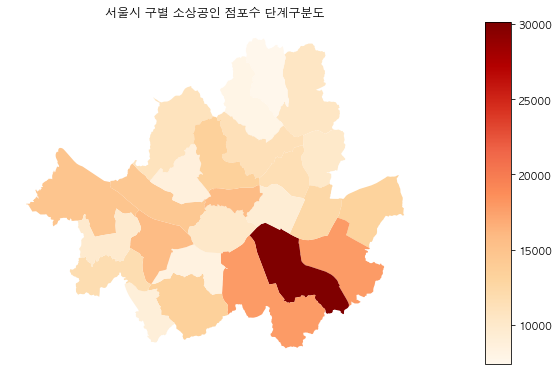

In [629]:
# 서울시 시군구 소상공인 단계구분도(Chropleth Map) 시각화
fig, ax = plt.subplots(1, 1)

# 범례
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

# 시각화
column = 'count'
gdf_admin_gu_pg3.plot(column, ax=ax, legend=True, cax=cax, cmap='OrRd')
ax.set_title("서울시 구별 소상공인 점포수 단계구분도")
ax.set_axis_off()
plt.show()

**서울시 구별 소상공인 점포수 단계구분도**

- 서울시 구별 소상공인 점포수가 가장 많은 구는 강남구로 나타났습니다.


# 2. 분석 프로세스

## 2.1 파생변수 생성

모델링에 사용될 파생변수를 다음과 같이 생성했습니다<br>
 * 1. 상대유동지수
 * 2. 역별 500m반경 수급처
 * 3. 일평균 기대생산량

### 2.1.1 파생변수 생성 : 상대유동지수

**전체년도에 대해 시간대별 영향력을 고려한 상대유동지수를 생성했습니다.**
<br>
* 스케일링 과정을 간편화하기 위해 스케일링 함수를 생성<br>
* 시간대별 영향력을 고려 : *(n시 전체 유동인구/ 전체 시간대 유동인구)*
* 연도별 평균유동인구 도출<br>
* 전체년도 평균유동인구를 minmax 표준화


In [83]:
# Scaling Methods에 따른 Scaling 함수 생성
def df_scaler(data, cols, scale):
    df_cp = data.copy()
    
    if scale == "minmax":
        X = df_cp.loc[:,cols]
        MinMaxScalers = MinMaxScaler()
        MinMaxScalers.fit(X)
        df_MinMaxScaler = MinMaxScalers.transform(X)
        df_cp.loc[:, cols] = df_MinMaxScaler
    elif scale == "standard" :
        X = df_cp.loc[:,cols]
        StandardScalers = StandardScaler()
        StandardScalers.fit(X)
        df_StandardScalers = StandardScalers.transform(X)
        df_cp.loc[:, cols] = df_StandardScalers
    elif scale == "robust" :
        X = df_cp.loc[:,cols]
        RobustScalers = RobustScaler()
        RobustScalers.fit(X)
        df_RobustScaler = RobustScalers.transform(X)
        df_cp.loc[:, cols] = df_RobustScaler
    else:
        print("wrong")
    return df_cp

In [84]:
# 각 연도별 승하차 데이터 분리
for i in range(18,22):
    exec(f"on_{i} = subway_{i}[on_cols]")
    exec(f"off_{i} = subway_{i}[off_cols]")
    
# 연도별 승하차 시간대별 비율 구하기 
for i in range(18,22):
    exec(f"time_on{i} = subway_{i}[on_cols].sum()/subway_{i}[on_cols].sum().sum()")
    exec(f"time_off{i} = subway_{i}[off_cols].sum()/subway_{i}[off_cols].sum().sum()")
    
    
# subway 데이터를 각 시간대 비율로 곱해준다 (시간대별 영향력)
for i in range(18,22):
    exec(f"scaled_{i} = subway_{i}.copy()")
    exec(f"scaled_{i}[on_cols] = subway_{i}[on_cols] * time_on{i}")
    exec(f"scaled_{i}[off_cols] = subway_{i}[off_cols] * time_off{i}")

scaled_{연도}데이터는 각 시간대의 영향력을 곱한 값을 저장했습니다

In [701]:
# 시간대별 비율을 곱한 연도별 역별 유동인구 합
subway_pop = pd.DataFrame({
    '역사명': list(scaled_18['역사명']),
    '유동인구_18': list(scaled_18.sum(axis=1)),
    '유동인구_19': list(scaled_19.sum(axis=1)),
    '유동인구_20': list(scaled_20.sum(axis=1)),
    '유동인구_21': list(scaled_21.sum(axis=1)),
})

각 연도별 평균 유동인구를 구한후 4개년도에 대한 평균 유동인구 컬럼을 추가했습니다.
<br>이를 MinMax Scaler를 통해 스케일링 해주어 최종 모델링에 필요한 **상대유동지수**를 생성했습니다.

In [87]:
subway_pop.insert(loc = 5 ,column = '유동인구_평균' ,value = list(subway_pop.iloc[:,1:5].mean(axis=1)) )

In [88]:
subway_pop["상대유동지수"] = df_scaler(subway_pop, cols = ["유동인구_평균"], scale = "minmax")["유동인구_평균"]
subway_pop.head()

,역사명,유동인구_18,유동인구_19,유동인구_20,유동인구_21,유동인구_평균,상대유동지수
0,4.19민주묘지역,11148.283725,11645.078539,8328.458445,8949.772053,10017.898191,0.020919
1,가락시장역,69036.285253,69658.609830,56455.068341,56377.421719,62881.846286,0.182196
2,가산디지털단지역,246186.732987,253982.714946,234710.565087,242613.101258,244373.278570,0.735889
3,가양역,73488.913542,75570.043373,62354.116177,63210.556043,68655.907283,0.199811
4,가오리역,14206.493344,14627.407777,11864.782958,12426.001297,13281.171344,0.030875


#### 상대유동지수 EDA

In [695]:
attr = subway_pop.sort_values("상대유동지수", ascending = False)["역사명"][:10]
v1 = subway_pop.sort_values("상대유동지수", ascending = False)["상대유동지수"][:10]
bar = Bar("18 ~ 21년 상대유동지수 TOP 10",width=500)#background_color = "#b8c4c2"
bar.add("상대유동지수", attr, v1, is_stack=False,label_color=['rgba(176, 196, 49, 0.92)'], xaxis_rotate=30)


**18년 ~ 21년 상대유동지수 TOP 10**

- 2018년에서 2021년까지 평균한 상대유동지수로 가장 높은 역 10개를 시각화 한 결과 강남역, 잠실역, 서울역 순으로 높게 나타났습니다.

### 2.1.2 파생변수 생성 : 일평균기대생산량
실제로 스마트팜이 설치되었을 때의 일평균기대생산량입니다. 역별로 공실에 해당하는 면적의 평균으로 일평균기대생산량을 계산했습니다.
<br>
    <br>**상도역 스마트팜 기준 단위면적당 생산량**
    <br>*월평균 394(m2)당 51kg*

In [92]:
#상도역 스마트팜 기준으로 월평균 394(m2)당 51kg을 생산하므로 단위면적당 생산량을 구함.
# 역별 각 공실별 기대생산량 도출
exp_produce = subway_rent.copy()
unit_area = 51/394

exp_produce["기대생산량"] = exp_produce["면적"]*unit_area
exp_produce["기대생산량"] = exp_produce["기대생산량"]*exp_produce["상가유형"].astype(int)
exp_produce

,상가유형,역사명,면적,기대생산량
0,0,서울역,33.00,0.000000
1,0,시청역,29.73,0.000000
2,0,시청역,57.60,0.000000
3,0,시청역,25.00,0.000000
4,0,시청역,25.00,0.000000
...,...,...,...,...
1638,1,고속터미널역,34.57,4.474797
1639,1,공항시장역,45.95,5.947843
1640,1,신방화역,57.34,7.422183
1641,1,샛강역,27.31,3.535051


역 중에서 서울시에 있지 않은 역이 있다는 것을 확인하고 해당역은 삭제하고 진행했습니다.
* 삭제된 역 : 단대오거리역 , 남한산성입구역

In [93]:
# 서울이 아닌 곳 지우기
rent_idx = exp_produce[(exp_produce["역사명"] == "단대오거리역")|(exp_produce["역사명"] == "남한산성입구역")].index
exp_produce.drop(rent_idx, inplace = True)

# groupby를 통해 중복 제거 및 면적 기대생산량 합
data = exp_produce.groupby(["역사명"], as_index=False).sum()
data.rename(columns = {'상가유형' : '공실개수','면적':'면적합'}, inplace = True)

# 1.1.1에서 전처리한 역별 위경도 결합
subway_rent_pre =  pd.merge(data, seoul_subway, on ="역사명")
subway_rent_pre

,역사명,공실개수,면적합,기대생산량,역위도,역경도
0,가락시장역,1,235.57,7.057157,37.492844,127.117987
1,가산디지털단지역,0,212.48,0.000000,37.481393,126.882605
2,강남구청역,1,1320.00,9.488071,37.517160,127.041219
3,강남역,3,183.22,7.785914,37.497202,127.028054
4,강동구청역,1,151.10,4.784162,37.530471,127.120269
...,...,...,...,...,...,...
201,홍제역,0,1440.96,0.000000,37.588524,126.944165
202,화곡역,0,298.14,0.000000,37.541757,126.840295
203,화랑대역,0,239.60,0.000000,37.620131,127.084426
204,회현역,0,132.00,0.000000,37.558517,126.978130


In [94]:
# 파생변수 일평균기대생산량 도출
subway_rent_pre['일평균기대생산량'] = subway_rent_pre['기대생산량'] / subway_rent_pre.loc[:,'공실개수']
subway_rent_pre['일평균기대생산량'] = subway_rent_pre['일평균기대생산량'].fillna(0)
subway_rent_pre

,역사명,공실개수,면적합,기대생산량,역위도,역경도,일평균기대생산량
0,가락시장역,1,235.57,7.057157,37.492844,127.117987,7.057157
1,가산디지털단지역,0,212.48,0.000000,37.481393,126.882605,0.000000
2,강남구청역,1,1320.00,9.488071,37.517160,127.041219,9.488071
3,강남역,3,183.22,7.785914,37.497202,127.028054,2.595305
4,강동구청역,1,151.10,4.784162,37.530471,127.120269,4.784162
...,...,...,...,...,...,...,...
201,홍제역,0,1440.96,0.000000,37.588524,126.944165,0.000000
202,화곡역,0,298.14,0.000000,37.541757,126.840295,0.000000
203,화랑대역,0,239.60,0.000000,37.620131,127.084426,0.000000
204,회현역,0,132.00,0.000000,37.558517,126.978130,0.000000


#### 일평균 기대생산량 EDA

In [707]:
from pyecharts import Bar

dat = subway_rent_pre[subway_rent_pre["공실개수"] != 0]
attr = dat.sort_values("일평균기대생산량", ascending = False)["역사명"][:10]
v1 = dat.sort_values("일평균기대생산량", ascending = False)["일평균기대생산량"][:10]
bar = Bar("공실 역별 일평균기대생산량 TOP 10",width=500)#background_color = "#b8c4c2"
bar.add("일평균기대생산량", attr, v1, is_stack=False,label_color=['rgba(176, 196, 100, 0.92)'], xaxis_rotate=30)

**공실 역별 일평균 기대생산량 Top 10**

- 공실이 있는 역별로 평균공실면적의 하루 기대생산량이 가장 높은 곳은 신대방역으로 하루에 약 31kg/m2를 생산할 수 있습니다.


### 2.1.3 파생변수 생성 : 수급처

지하철역과 서울에 있는 소상공인 가게들 사이의 지구의 구 표면을 따라 최단거리를 측정하는 함수(count_buffer)를 우선적으로 생성했습니다. <br>
함수 내 조건문을 활용하여 지하철역 좌표를 중심으로 500m 반경 내에 있는 가게들의 개수를 파악했습니다.  <br>

#### **(수급처) = (역 반경 500m 내 소상공인 점포수)**

In [97]:
from sklearn.metrics.pairwise import haversine_distances 

In [98]:
def count_buffer(df_1 , df_2, buff_rad):
    '''
    설정한 버퍼 반지름 이내의 지점 수를 위경도 기반 haversine을 사용하여 계산하는 함수
    # 필수 import 라이브러리)
    @ numpy
    @ pandas
    @ haversine_distances (sklearn.metrics.pairwise)
    
    # parameters)
    @ df_1 : 위경도 값이 있는 데이터프레임
    @ df_2 : 위경도 값이 있는 데이터프레임
    @ buff_rad : 설정할 버퍼의 반경 (입력값은 반드시 km 단위)
    '''
    
    result = haversine_distances(np.radians(df_1), np.radians(df_2))
    result = pd.DataFrame(result * 6371000/1000) # rad to kilometers
    result1 = result[result < buff_rad]
    counts = result1.count(axis = 1)
    return counts

In [99]:
# 지하철역과 서울 내 소상공인 점포들 사이의 거리를 측정하여 역으로부터 반경 0.5km내에 위치한 점포들에 대한 지수 생성 
store_pre = seoul_subway.loc[:,['역사명','역위도','역경도']]
store_coor = st_pre.loc[:,['위도','경도']]

store_pre['수급처']= count_buffer(store_pre.iloc[:,1:],store_coor, 0.5) 
# df_dist = pd.DataFrame(dist , columns = ["수급처"])

In [100]:
# 소상공인 수급처 데이터
store_pre

,역사명,역위도,역경도,수급처
0,4.19민주묘지역,37.652203,127.013537,264
1,가락시장역,37.492844,127.117987,323
2,가산디지털단지역,37.481393,126.882605,544
3,가양역,37.563176,126.854437,178
4,가오리역,37.641644,127.016799,304
...,...,...,...,...
290,화랑대역,37.620131,127.084426,110
291,회기역,37.589802,127.057936,319
292,회현역,37.558517,126.978130,673
293,효창공원앞역,37.539416,126.961355,338


### 2.1.4 Data Integration
앞서 새롭게 생성한 3가지의 파생변수 '상대유동지수', '월평균 기대생산량', '수급지수'를 Column '역사명'을 기준으로 하나의 통합된 데이터셋으로 만들었습니다.
* 스마트팜 설치예정인 남부터미널역은 공실데이터가 존재하지 않기 때문에 final데이터에 존재하지 않았습니다. 따라서 남부터미널 역 데이터를 따로 추가해주었습니다.

In [637]:
final = pd.merge(subway_rent_pre[['역사명','공실개수','면적합','일평균기대생산량']],subway_pop,on='역사명')
final = pd.merge(final,store_pre,on='역사명')
plus = pd.Series([0.360109,37.484825,127.01619,"남부터미널역", 396], index = ["상대유동지수", "역위도","역경도","역사명","수급처"])
final =final.append(plus, ignore_index = True)
final =final.fillna(0)
final.head()

,역사명,공실개수,면적합,일평균기대생산량,유동인구_18,유동인구_19,유동인구_20,유동인구_21,유동인구_평균,상대유동지수,역위도,역경도,수급처
0,가락시장역,1.0,235.57,7.057157,69036.285253,69658.609830,56455.068341,56377.421719,62881.846286,0.182196,37.492844,127.117987,323
1,가산디지털단지역,0.0,212.48,0.000000,246186.732987,253982.714946,234710.565087,242613.101258,244373.278570,0.735889,37.481393,126.882605,544
2,강남구청역,1.0,1320.00,9.488071,99471.929626,104804.325950,91294.754693,94638.824691,97552.458740,0.287969,37.517160,127.041219,513
3,강남역,3.0,183.22,2.595305,382819.417576,382796.975926,286350.710230,271811.419086,330944.630705,1.000000,37.497202,127.028054,1001
4,강동구청역,1.0,151.10,4.784162,41367.883855,40484.987520,34107.276226,34920.733339,37720.220235,0.105433,37.530471,127.120269,366


### 2.1.5 통합 데이터 EDA

통합데이터로 진행된 EDA는 다음과 같습니다:
<br>
* 공실 역별 수급처 Top 10
* 공실 역별 수급처 히트맵
* 공실 역별 상대유동지수 히트맵

In [705]:
# 공실 역별 수급처
dat = final[final["공실개수"] != 0]
attr = dat.sort_values("수급처", ascending = False)["역사명"][:10]
v1 = dat.sort_values("수급처", ascending = False)["수급처"][:10]
bar = Bar("공실 역별 수급처  TOP 10",width=500)#background_color = "#b8c4c2"
bar.add("수급처", attr, v1, is_stack=False, label_color=['rgba(176, 196, 100, 0.92)'], xaxis_rotate=30)
bar

**공실 역별 수급처 Top 10**

- 공실이 있는 역별로 주변 반경 500m 이내에 수급처가 가장 많은 역은 강남역, 상수역, 종각역 순으로 각각 1001개, 958개, 940개로 나타났습니다.

In [103]:
##### 초기 설정

In [478]:
# file directory setup
file_root = '데이터종합_국토부.csv'
file_geojson = 'seoul_gu4326.geojson'
file_store = '소상공인시장진흥공단_상가(상권)정보_서울_202106.csv'
app_info  = 'Applications_info.json'

In [479]:
def coord_lister(geom):
    '''
    geometry 정보를 pydeck 형식인 coordinate list로 풀어주는 함수
    '''
    coords = list(geom.exterior.coords)
    return (coords)

In [501]:
def make_pydeck_base(data, geometry_info = 'coor', color_code = '[0,0,0,50]' , **params):
    '''
    pydeck 배경에 쓰일 PolygonLayer를 만드는 함수
    '''
    base = pdk.Layer(
    'PolygonLayer', # 사용할 Layer 타입
    data, # 시각화에 쓰일 데이터프레임
    get_polygon = geometry_info, # geometry 정보를 담고있는 컬럼 이름
    get_fill_color = color_code, # 각 데이터 별 rgb 또는 rgba 값 (0~255)
    **params
    )
    
    return base
    
def make_pydeck_layer(data, layer, geometry_info = '[역경도, 역위도]', **params):
    '''
    pydeck layer를 만드는 함수
    '''
    
    layer_ = pdk.Layer(
    layer,
    data = data,
    get_position= geometry_info,
    **params
    )
    
    return layer_

def make_pydeck_view(center, zoom):
    '''
    pydeck view 상태를 설정해주는 함수
    '''
    view_state = pdk.ViewState(
        longitude=center[0],
        latitude=center[1],
        zoom=zoom
    )
    return view_state

def pydeck_viewer(layers, view_state, show = True, **params):
    '''
    layer들과 view 정보들로 지도를 보여주는 함수
    # 필수 parameters)
    @ layers : 저장한 레이어 리스트
    @ view_state : make_pydeck_view 함수로 설정한 initial view
    @ to_html : html로 저장할 경우 True 값
    '''
    deck_ = pdk.Deck(layers=layers, initial_view_state=view_state,
                     **params)
    
    if show == False:
        return deck_
    else:
        return deck_.show()

In [481]:
# get pydeck token
import json
with open(app_info, 'r') as f:
    info = json.load(f)

token = info['mapbox']['token']

In [482]:
# set env variable
import os
os.environ["MAPBOX_API_KEY"]= token

In [483]:
##### 데이터 변경

In [484]:
# pydeck은 pandas dataframe을 읽기 때문에 geometry 정보를 변경
layer_seoul = gpd.read_file(file_geojson)

layer_seoul['coor'] = layer_seoul.geometry.apply(coord_lister)
del layer_seoul['geometry']

seoul = pd.DataFrame(layer_seoul)

In [485]:
# 시군구명 붙여주기
store = pd.read_csv(file_store)
store_gu = store.groupby(['시군구명'], as_index = False)['상호명'].count()
store_gu.reset_index(drop = True, inplace = True)
store_gu.rename(columns = {'시군구명' : 'name'}, inplace = True)

seoul = seoul.merge(store_gu, on = 'name')

In [486]:
# 종합데이터 불러오기
root = pd.read_csv(file_root, encoding = 'utf-8',
                   usecols = ['공실개수', '역사명', '역위도', '역경도', '일평균기대생산량', '상대유동지수', '수급처'])

In [487]:
##### 세팅값 설정

In [488]:
# color setting
gray = '[234, 233, 215]'

color_scale = [
    [238, 234, 37],
    [243, 215, 15],
    [246, 190, 21],
    [246, 162, 28],
    [242, 135, 32],
    [242, 106, 33],
    [240, 85, 35],
    [238, 55, 35],
    [206, 23, 31],
    [139, 3, 5]
]

In [489]:
##### 지도 시각화

In [573]:
import pydeck as pdk
base = make_pydeck_base(seoul, color_code = '[255,255,255, 50]')

In [574]:
layer_store   = make_pydeck_layer(root, 'HeatmapLayer', 
                                  get_weight = '수급처', color_range = color_scale)

layer_move    = make_pydeck_layer(root, 'HeatmapLayer',
                                  get_weight = '상대유동지수', color_range = color_scale)

layer_empty   = make_pydeck_layer(root, 'HeatmapLayer', 
                                  get_weight = '일평균기대생산량', color_range = color_scale)

layer_scatter = make_pydeck_layer(root, 'ScatterplotLayer',
                                  radius_scale = 300, opacity = 0.05,
                                  get_fill_color = '[255,255,255]', get_line_color = '[255,255,255]',
                                  pickable = True, auto_highlight=True)

In [575]:
center = [126.986,37.563]
zoom = 10

view_state = make_pydeck_view(center, zoom)
view_state.bearing = 0
view_state.pitch = 0

In [576]:
# set tooltip
store_text = {
    'text' : '역사명 : {역사명}\n위경도 : ({역위도},{역경도})\n500m 반경 내 수급처 수 : {수급처}'
}

move_text = {
    'text' : '역사명 : {역사명}\n위경도 : ({역위도},{역경도})\n상대유동지수 : {상대유동지수}'
}

expect_text = {
    'text' : '역사명 : {역사명}\n위경도 : ({역위도},{역경도})\n일평균기대생산량 : {일평균기대생산량}'
}

In [646]:
##### 역별 수급처

In [579]:
# 수급처

layers = [base, layer_store, layer_scatter]
r = pydeck_viewer(layers, view_state, show = False, map_provider = 'mapbox',map_style='dark',tooltip = text)
r.to_html(offline = True)

**역별 수급처 수 Heatmap**

- 색이 붉고 진해질수록 수급처 수가 많은 곳이고, 색이 노랗고 옅어질수록 수급처 수가 적은 곳입니다.
- 지도는 좌클릭으로 상하좌우 움직일 수 있고, 마우스 휠로 확대 및 축소가 가능하며, 우클릭으로 회전시킬 수 있습니다.

In [496]:
##### 역별 상대유동지수

In [578]:
# 상대유동지수
layers = [base, layer_move, layer_scatter]
r = pydeck_viewer(layers, view_state, show = False, map_provider = 'mapbox',map_style='dark', tooltip = text)
r.to_html(offline = True)

**역별 상대유동지수 Heatmap**

- 색이 붉고 진해질수록 상대유동지수가 높은 곳 이고, 색이 노랗고 옅어질수록 상대유동지수가 낮은 곳입니다.
- 지도는 좌클릭으로 상하좌우 움직일 수 있고, 마우스 휠로 확대 및 축소가 가능하며, 우클릭으로 회전시킬 수 있습니다.


## 2.2 Data Scaling
2.1 과정을 진행하며 생성한 3개의 파생변수들은 Scale이 각각 천차만별입니다. <br>
Scale에 민감한 머신러닝 알고리즘을 수행하기 위해서는 변수들에 대한 Data Scaling 과정이 필요합니다. <br>
따라서 Data Scaling을 간편하게 할 수 있는 함수(df_scaler)를 먼저 만들었습니다. <br>
가장 성능이 좋은 Scaling Method를 파악하기 위해 아래 3가지의 방법을 모두 실시하고 성능을 비교해 볼 것입니다.
 * Scaling Methods 
    * Standard Scaling
    * MinMax Scaling
    * Robust Scaling

In [126]:
# Scaling Methods에 따른 Scaling 함수 생성
def df_scaler(data, cols, scale):
    df_cp = data.copy()
    
    if scale == "minmax":
        X = df_cp.loc[:,cols]
        MinMaxScalers = MinMaxScaler()
        MinMaxScalers.fit(X)
        df_MinMaxScaler = MinMaxScalers.transform(X)
        df_cp.loc[:, cols] = df_MinMaxScaler
    elif scale == "standard" :
        X = df_cp.loc[:,cols]
        StandardScalers = StandardScaler()
        StandardScalers.fit(X)
        df_StandardScalers = StandardScalers.transform(X)
        df_cp.loc[:, cols] = df_StandardScalers
    elif scale == "robust" :
        X = df_cp.loc[:,cols]
        RobustScalers = RobustScaler()
        RobustScalers.fit(X)
        df_RobustScaler = RobustScalers.transform(X)
        df_cp.loc[:, cols] = df_RobustScaler
    else:
        print("wrong")
    return df_cp

## 2.3 Clustering
군집화가 가장 잘 이루어지는 알고리즘을 선정하기 위해 아래와 같은 다양한 Clustering Method를 활용했습니다. <br>
시각화한 그래프 상 군집화가 잘 이루어지며, Silhouette Coeffient가 비교적 크고, Davies-Bouldin Index가 비교적 작은 알고리즘 선정 찾아내는 과정입니다.
 * Clustering Methods
   * Hierarchical Clustering
   * K-means
   * DBSCAN

### 2.3.1 Hierarchical Clustering
계층적 군집분석에는 5가지의 거리 측정법을 활용할 수 있습니다. <br>
그 중 가장 군집화가 잘 이루어지는 거리 측정법을 선정하기 위해 모든 거리측정법을 활용해 아래 그래프롸 같이 시각해보았습니다. <br>
Silhouette score와 Davies-Bouldin Index도 함께 확인했습니다. <br>
그 결과 'ward' 거리 측정법이 가장 군집화 성능이 좋은 것으로 파악했습니다. <br>



* 계층적 군집분석의 결과를 확인하기 위해서 "수급처"는 minmax, robust, standard, unscaled를 통해 scaling을 진행하였습니다
    * 연결변의 종류로는 'single', 'complete', 'average', 'centroid', 'ward'를 사용하여 확인하였습니다.
    * 총 20가지의 Dendrogram을 통해 군집을 확인하였습니다.

In [127]:
from sklearn.metrics import silhouette_samples, silhouette_score,davies_bouldin_score

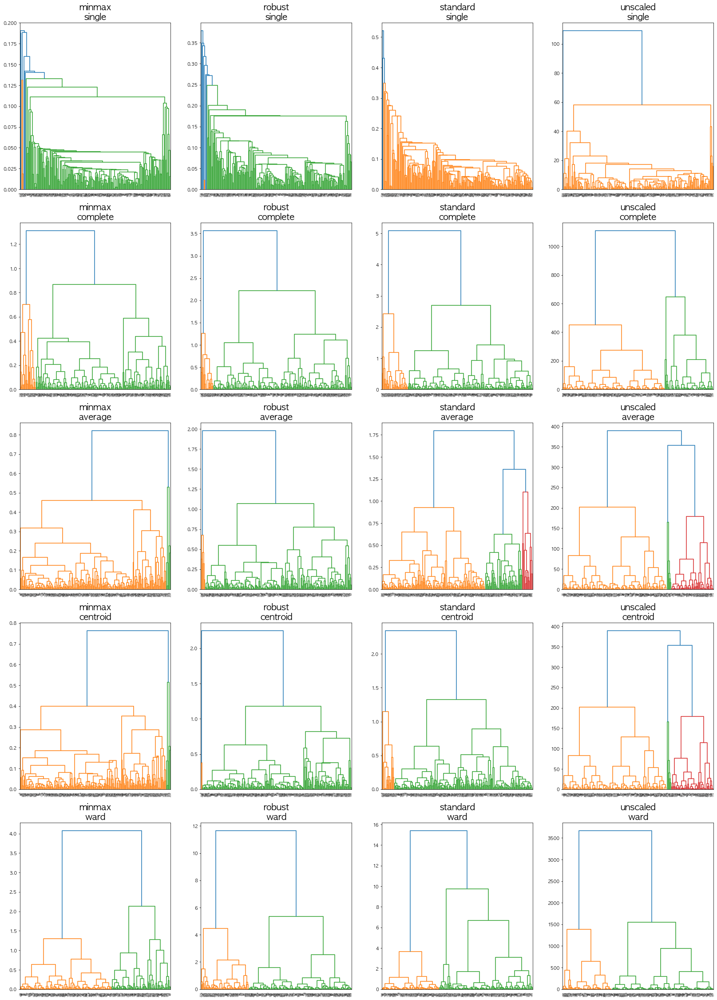

In [588]:
df = final.copy()
cols = ["상대유동지수", "수급처"]
cols_ = ["수급처"]
scaler = ['minmax', 'robust', 'standard', 'unscaled']
box = {}
for m in scaler:
    if m == 'unscaled':
        box[m] = df.loc[:,cols]
    else:
        box[m] = df_scaler(df, cols_, scale = m)

n=len(box)

linkage_list = ['single', 'complete', 'average', 'centroid', 'ward']

fig, axes = plt.subplots(nrows=len(linkage_list), ncols=n, figsize=(28, 40))
for i in range(len(linkage_list)):
    for j in range(len(scaler)):
        hierarchical_single = linkage(box[scaler[j]].loc[:,cols], method=linkage_list[i])
        dn = dendrogram(hierarchical_single, ax=axes[i][j])
        axes[i][j].set_title(f"{scaler[j]}\n{linkage_list[i]}", fontsize = 20)
        
        
plt.show()

* 'ward' 연결법이 가장 군집을 잘 분류한다고 판단하여서 "수급처"를 Scaling method별로 적용하여 Scatter Plot을 그렸습니다.

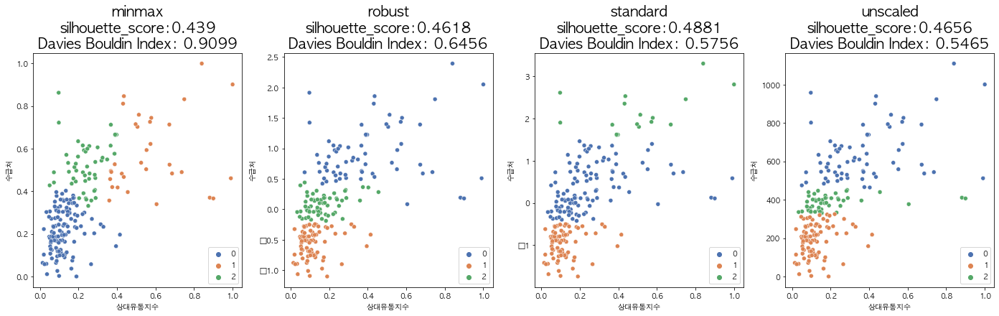

In [129]:
# Scatter Plot으로 군집화 시각화 확인
n = len(box)
fig, axes = plt.subplots(1,n,figsize = (6 * n, 6))

for i in range(len(scaler)):
    
    agg_clustering = AgglomerativeClustering(n_clusters=3, linkage='ward')
    labels = agg_clustering.fit_predict(box[scaler[i]].loc[:,cols])
    
    s=sns.scatterplot(x= cols[0], y=cols[1], data= box[scaler[i]], hue=labels, palette='deep', ax = axes[i], marker='o')
    s.set_title(f"{scaler[i]}\nsilhouette_score:{round(silhouette_score(box[scaler[i]].loc[:,cols], labels),4)}\nDavies Bouldin Index: {round(davies_bouldin_score(box[scaler[i]].loc[:,cols],labels),4)}", fontsize = 20)

plt.show()

### 2.3.2 K-means
K-means는 비계층적 군집분석의 방법 중 가장 대표적인 중심 기반 알고리즘입니다. <br>
군집화될 군집의 개수를 결정하기 위해 Elbow plot을 확인했습니다. <br>
결정된 군집 개수에 따라 모델을 학습하고 Scatter plot과 Silhouette score, Davies-Bouldin Index를 확인했습니다.

* 이번에도 "수급처"의 Scaling만 진행하면서 분석을 진행하였습니다.
* K-means 알고리즘을 수행하기 앞서 Elbow Method로 군집 개수를 결정했습니다.


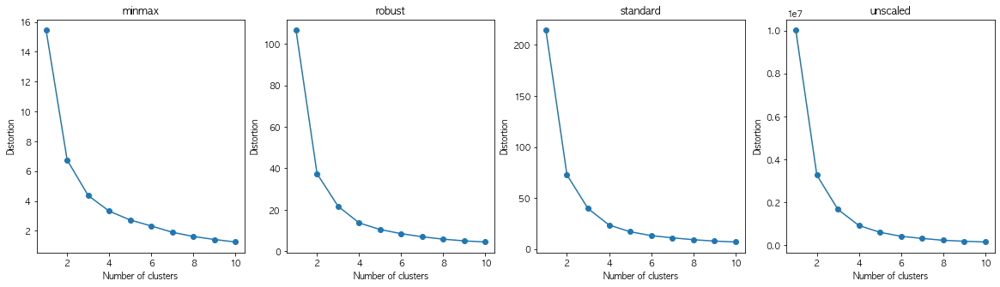

In [269]:
df = final.copy()
cols = ["상대유동지수", "수급처"]
cols_ = ["수급처"]
#df["상대유동지수"] = df_scaler(df, cols = ["상대유동지수"], scale = "minmax")["상대유동지수"]
scaler = ['minmax', 'robust', 'standard', 'unscaled']
box = {}

for m in scaler:
    if m == 'unscaled':
        box[m] = df.loc[:,cols]
    else:
        box[m] = df_scaler(df, cols_, scale = m)


n = len(box)
fig, axes = plt.subplots(1,n,figsize = (5 * n, 5))
for i in range(len(scaler)):
    distortions = []
    for j in range(1, 11):
        km = KMeans(n_clusters=j)
        km.fit(box[scaler[i]].loc[:,cols])
        distortions.append(km.inertia_) # 군집 내 분산, 적을수록 좋음
    
    axes[i].plot(range(1, 11), distortions, marker='o')
    axes[i].set_title(scaler[i])
    axes[i].set_xlabel('Number of clusters')
    axes[i].set_ylabel('Distortion')
plt.show()

* 최적의 군집 개수인 K는 3으로 결정되었습니다. 이에따라 군집의 개수를 3개로 결정하고 K-means Algorithm을 시행하였습니다.


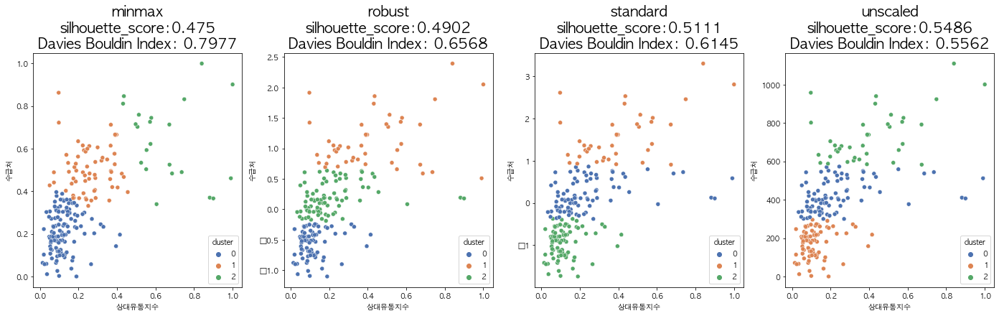

In [611]:
n = len(box)
fig, axes = plt.subplots(1,n,figsize = (6 * n, 6))
for i in range(len(scaler)):
    
    kmeans = KMeans(n_clusters=3)
    kmeans.fit(box[scaler[i]].loc[:,cols])
    box[scaler[i]]['cluster'] = kmeans.labels_
    
    s = sns.scatterplot(x = cols[0], y = cols[1], data = box[scaler[i]], marker='o', hue = 'cluster', palette = 'deep', ax = axes[i])
    s.set_title(f"{scaler[i]}\nsilhouette_score:{round(silhouette_score(box[scaler[i]].loc[:,cols], kmeans.labels_),4)}\nDavies Bouldin Index: {round(davies_bouldin_score(box[scaler[i]].loc[:,cols],kmeans.labels_),4)}", fontsize = 20)

    #s.set_xlabel(cols[0])
    #s.set_ylabel(cols[1])
plt.show()

* silhouette_score가 가장 높고 Davis Bouldin Index가 가장 낮은 것은 "수급처"를 스케일하지 않은 것(unscaled)이였지만, 4번째 그림에서 보다시피 "수급처"의 영향을 적절하게 줄이지 못해서 계층적으로 나뉘는 것을 보실 수 있습니다.

* 반면, "수급처"에 MinMax Scaling을 적용한 1번 그림은 "수급처"의 영향을 적절하게 줄여 군집이 잘 나뉘어진 것을 보실 수 있습니다.

### 2.3.3 DBSCAN 
DBSCAN은 중심 기반 알고리즘인 K-means와 달리 밀도 기반(Density-Based) 알고리즘입니다. <br>
k-means와 다르게 군집의 개수를 지정할 필요가 없으며, 알고리즘이 자동으로 군집의 개수를 찾습니다. <br>
자동으로 결정된 군집 개수에 따라 모델을 학습하고 Scatter plot과 Silhouette score, Davies-Bouldin Index를 확인했습니다. <br>

* Dbscan을 통해 군집분석을 진행하기 전에 hyper paramter를 정하기 위한 작업을 진행하였습니다.
* 이번에도 "수급처"의 Scaling만 진행하면서 분석을 진행하였습니다.

In [271]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

0.04717175720136648
0.11940147194003797
0.126141347504893
11.005651585444424


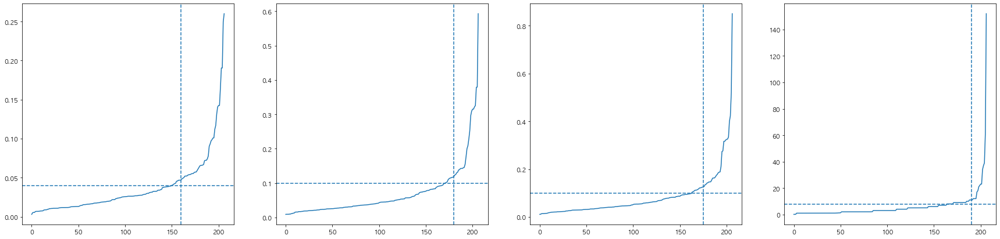

In [608]:
df = final.copy()
cols = ["상대유동지수", "수급처"]
cols_ = ["수급처"]
scaler = ['minmax', 'robust', 'standard', 'unscaled']
box = {}
for m in scaler:
    if m == 'unscaled':
        box[m] = df.loc[:,cols]
    else:
        box[m] = df_scaler(df, cols_, scale = m)

n=len(box)

fig, axes = plt.subplots(nrows= 1, ncols=4, figsize=(30, 7))

xaxis = [0.04, 0.1, 0.1, 8]
yxis = [160, 180, 175, 190]
par = []
for i in range(len(scaler)):
    eigh = NearestNeighbors(n_neighbors=4)
    eigh.fit(box[scaler[i]].loc[:,cols])
    distances, indices = eigh.kneighbors(box[scaler[i]].loc[:,cols])
    
    axes[i].plot(np.sort(distances[:, 2]))
    axes[i].axvline(yxis[i], 0, 2, ls='--')
    axes[i].axhline(xaxis[i], 0, yxis[i], ls='--')
    print(np.sort(distances[:, 2])[yxis[i]])
    par.append(np.sort(distances[:, 2])[yxis[i]])
        
plt.show()

* MinPts= 4, Eps는 변곡점을 기준으로 결정하였습니다. 

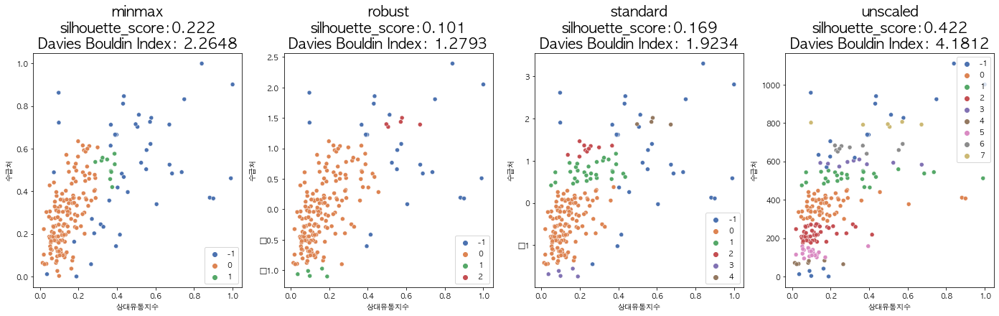

In [612]:
n = len(box)
fig, axes = plt.subplots(1,n,figsize = (6 * n, 6))

for i in range(len(scaler)):
    
    dbscan = DBSCAN(eps=par[i], min_samples=4) # 위에서 구한 eps와 minpts로 scaling된 데이터 DBSCAN 학습
    dbscan.fit(box[scaler[i]].loc[:,cols])
    
    s=sns.scatterplot(x= cols[0], y=cols[1], data= box[scaler[i]], hue=dbscan.labels_, palette='deep', ax = axes[i], marker='o')
    s.set_title(f"{scaler[i]}\nsilhouette_score:{round(silhouette_score(box[scaler[i]].loc[:,cols], dbscan.labels_),4)}\nDavies Bouldin Index: {round(davies_bouldin_score(box[scaler[i]].loc[:,cols],dbscan.labels_),4)}", fontsize = 20)

plt.show()

* Dbscan의 전체적으로 Silhouette Score가 낮고 Davies-Bouldin Index가 높은 것을 확인할 수 있습니다.
  * DBSCAN의 성능이 다른 Clustering Algorithm에 비해 좋지 않기 때문에 우선적으로 제외하였습니다.

### 2.3.4 Clustuering Method별 비교

* 앞서 소개한 3가지 주요 군집화 방법을 포함하여 총 9가지 군집화 방법을 모두 활용하여 9개의 군집분석을 한눈에 시각화하였습니다.
<br>

* "수급처"에 대한 Scaling Method별 군집화 결과를 그래프를 통해 비교하고 확인하였습니다. <br>
   MinMax - Standard - Robust Scaling 순으로 살펴보겠습니다.

In [274]:
from sklearn import cluster, mixture
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler
from itertools import cycle, islice

In [586]:
def cluster_plot(data, scal):
    df = data.copy()
    cols = ["상대유동지수", "수급처"]
    #df["상대유동지수"] = df_scaler(df, cols = ["상대유동지수"], scale = "minmax")["상대유동지수"]
    df["수급처"] = df_scaler(df, cols = ["수급처"], scale = scal)["수급처"]
    dataset = df.copy()
    dataset = dataset[cols]
    
    params  ={'eps': .3, 'n_neighbors': 2, 'min_samples': 5, 'xi': 0.035, 'min_cluster_size': .2 , "n_clusters" : 3,
              'quantile': 0.3, 'damping': .9,'preference': -200}

    # estimate bandwidth for mean shift
    bandwidth = cluster.estimate_bandwidth(dataset, quantile=params['quantile'])

    # connectivity matrix for structured Ward
    connectivity = kneighbors_graph(dataset, n_neighbors=params['n_neighbors'], include_self=False)
    # make connectivity symmetric
    connectivity = 0.5 * (connectivity + connectivity.T)

    ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True)

    two_means = cluster.MiniBatchKMeans(n_clusters=params['n_clusters'])

    ward = cluster.AgglomerativeClustering(
            n_clusters=params['n_clusters'], linkage='ward',
            connectivity=connectivity)

    spectral = cluster.SpectralClustering(
            n_clusters=params['n_clusters'], eigen_solver='arpack',
            affinity="nearest_neighbors")

    dbscan = cluster.DBSCAN(eps=params['eps'])

    optics = cluster.OPTICS(min_samples=params['min_samples'],
                                xi=params['xi'],
                                min_cluster_size=params['min_cluster_size'])

    affinity_propagation = cluster.AffinityPropagation(
            damping=params['damping'], preference=params['preference'])

    average_linkage = cluster.AgglomerativeClustering(
            linkage="average", affinity="cityblock",
            n_clusters=params['n_clusters'], connectivity=connectivity)

    birch = cluster.Birch(n_clusters=params['n_clusters'])

    gmm = mixture.GaussianMixture(
            n_components=params['n_clusters'], covariance_type='full')

    clustering_algorithms = (
            ('MiniBatch_nKMeans', two_means),
            ('MeanShift', ms),
            ('Spectral_Clustering', spectral),
            ('Ward', ward),
            ('Agglomerative_Clustering', average_linkage),
            ('DBSCAN', dbscan),
            ('OPTICS', optics),
            ('BIRCH', birch),
            ('Gaussian_Mixture', gmm)
    )


    fig, axes = plt.subplots(3,3,figsize = (21, 21))
    
    

    for i in range(len(clustering_algorithms)):

        algorithm = clustering_algorithms[i][1]
        algorithm.fit(dataset)
        if hasattr(algorithm, 'labels_'):
            y_pred = algorithm.labels_.astype(int)
        else:
            y_pred = algorithm.predict(dataset)

        axes = axes.flatten()
        if len(set(y_pred))!=1: 
            s = sns.scatterplot(x = cols[0], y = cols[1], data= dataset , hue=y_pred, palette='deep' , ax = axes[i])
            s.set_title(f"{clustering_algorithms[i][0]}\nsilhouette_score:{round(silhouette_score(dataset,y_pred),4)}\nDavies Bouldin Index: {round(davies_bouldin_score(dataset,y_pred),4)}", fontsize = 10)
        else:
            s = sns.scatterplot(x = cols[0], y = cols[1], data= dataset , hue=y_pred, palette='deep' , ax = axes[i])
            s.set_title(f"{clustering_algorithms[i][0]}", fontsize = 10)
            
    plt.show()


##### MinMax Scaled

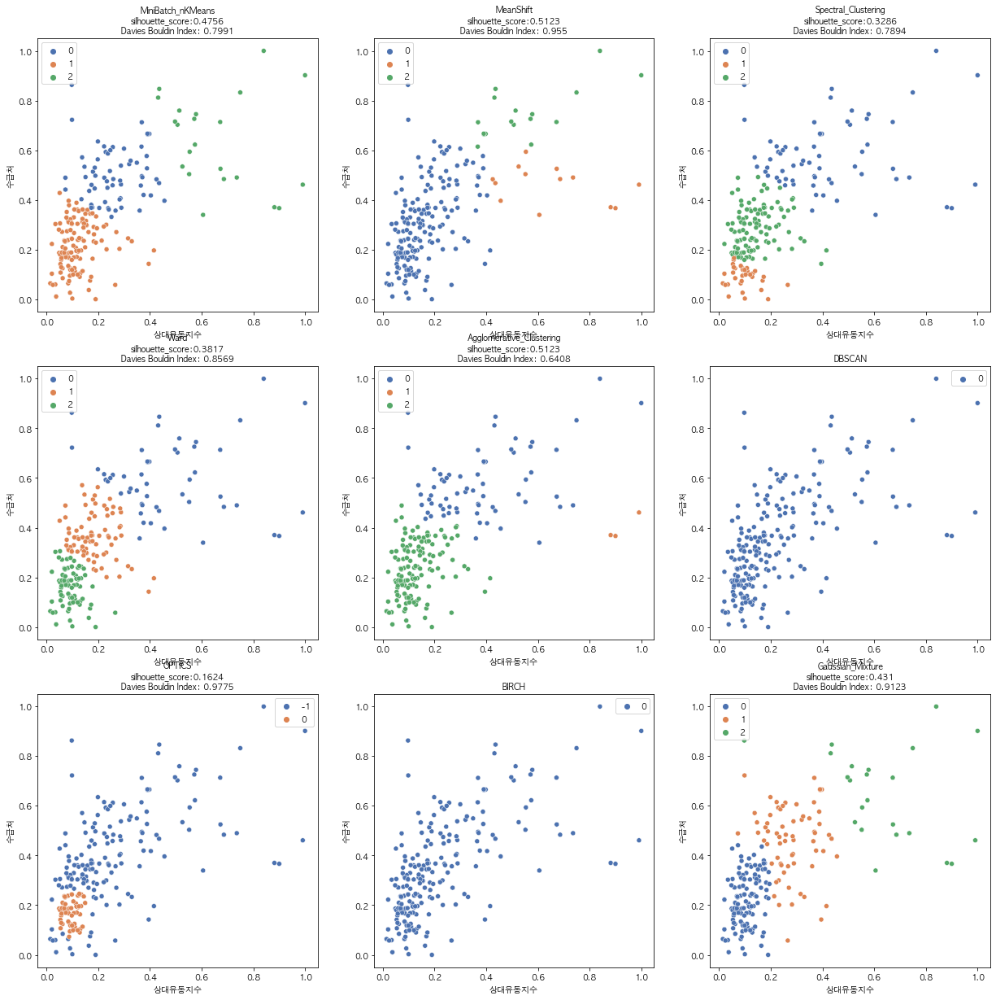

In [587]:
cluster_plot(final, scal = "minmax")

##### Standard Scaled

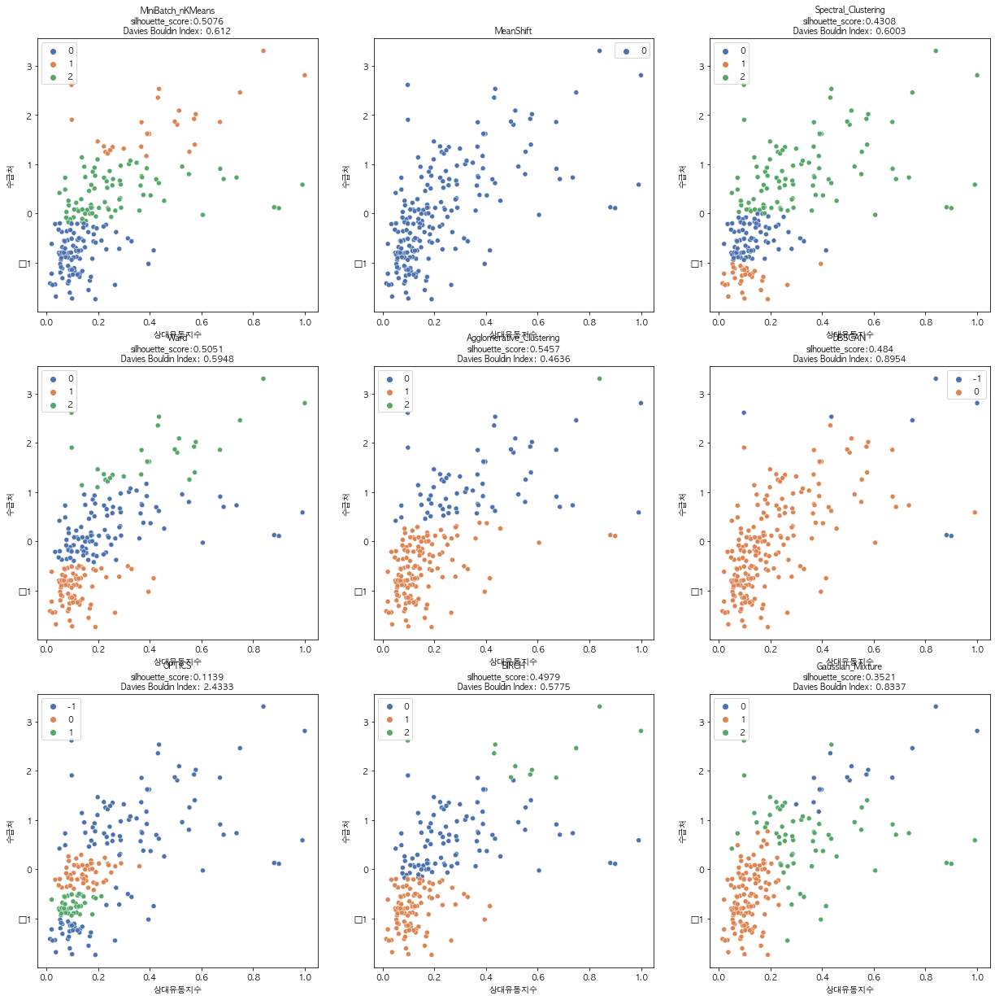

In [277]:
cluster_plot(final, scal = "standard")

##### Robust Scaled

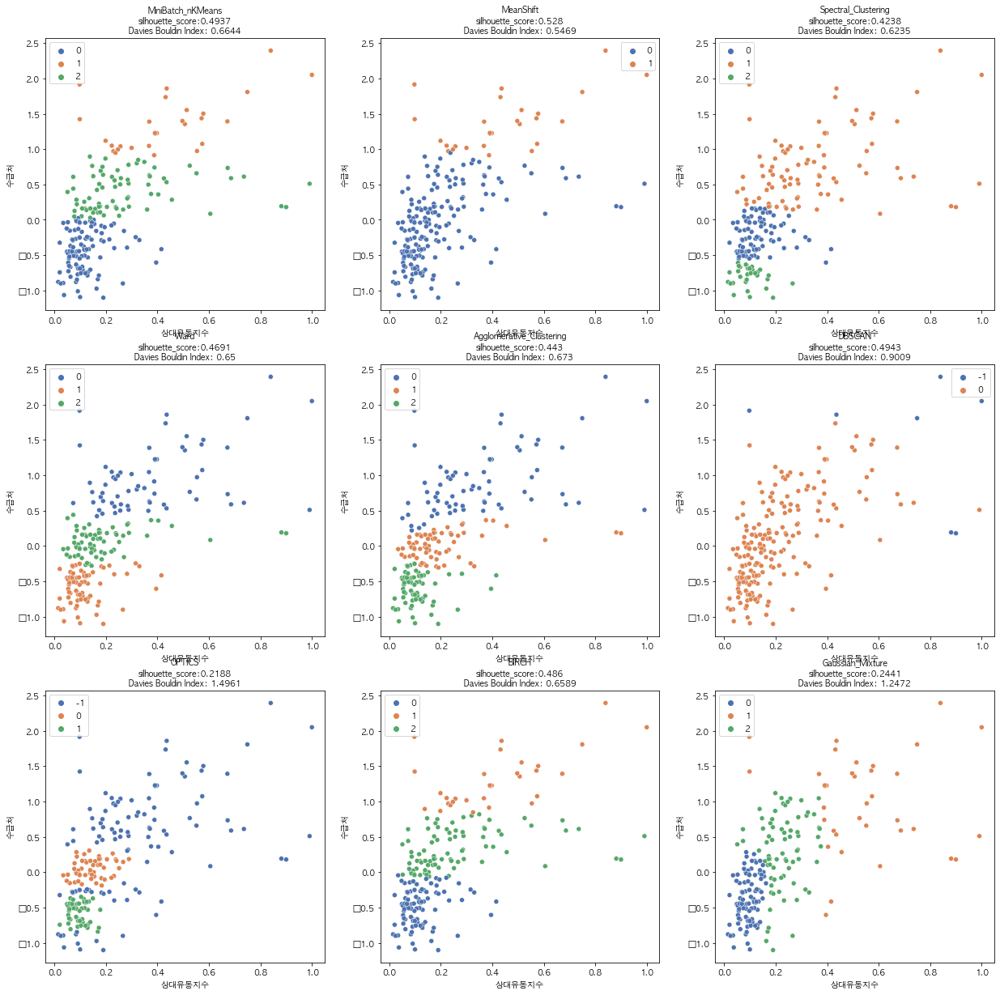

In [278]:
cluster_plot(final, scal = "robust")

* 총 **27가지**의 군집을 확인하였지만 **2.3.2**에서 진행한 **MinMax Scaled K-means (cluster 3개)**의 군집화가 가장 잘 된 것을 확인할 수 있었습니다.

## 2.4 분석결과 요약
  * 최적 알고리즘 결정 및 시각화 : MinMax Scaled K-means (cluster 3개)
  <br><br>
  * 군집화 결과 및 특성 확인
 <br><br>
    * 군집0 : 상대유동지수와 수급지수는 가장 낮지만, **기대생산량이 최대** 수준으로 나타났습니다.
    <br>
    <br>
    * 군집1 : 상대유동지수와 수급지수, 기대생산량 모두 보통 수준으로 나타났습니다.
    <br>
    <br>
    * 군집2 : 상대유동지수와 수급지수는 가장 높지만, 기대생산량이 최저 수준으로 나타났습니다.
    <br>
    <br>
  * 기존 설치된 메트로팜 군집 확인
  <br><br>
    * 군집0 : 상도역, 천왕역, 답십리역, 충정로역
    <br>
    <br>
    * 군집1 : 을지로3가역, 남부터미널역(신설예정)
    <br>

### 2.4.1 최적 알고리즘 결정 및 시각화 : MinMax Scaled K-means (Cluster 3개)

In [326]:
df = final.copy()
cols = ["상대유동지수", "수급처"]
df["수급처"] = df_scaler(df, cols = ["수급처"], scale = "minmax")["수급처"]
dataset = df.copy()
dataset = dataset[cols]

In [327]:
kmeans = KMeans(n_clusters=3)
kmeans.fit(dataset)
y_pred =kmeans.labels_
model_data = dataset.copy()
model_data["cluster"] = y_pred
model_data["역사명"] = final["역사명"]

In [328]:
model_data["일평균기대생산량"] = final["일평균기대생산량"]
model_data["공실개수"] = final["공실개수"]

In [329]:
model_data

,상대유동지수,수급처,cluster,역사명,일평균기대생산량,공실개수
0,0.182196,0.290991,0,가락시장역,7.057157,1.0
1,0.735889,0.490090,2,가산디지털단지역,0.000000,0.0
2,0.287969,0.462162,1,강남구청역,9.488071,1.0
3,1.000000,0.901802,2,강남역,2.595305,3.0
4,0.105433,0.329730,0,강동구청역,4.784162,1.0
...,...,...,...,...,...,...
202,0.282623,0.401802,1,화곡역,0.000000,0.0
203,0.102606,0.099099,0,화랑대역,0.000000,0.0
204,0.299614,0.606306,1,회현역,0.000000,0.0
205,0.097516,0.304505,0,효창공원앞역,0.000000,0.0


In [330]:
def custom_formatter(params):
    return params.value[3]

extra_data0 = [0] *len(model_data[model_data['cluster']==0])
extra_name0 = list(model_data[model_data['cluster']==0]['역사명'])
extra_data1 = [0] *len(model_data[model_data['cluster']==1])
extra_name1 = list(model_data[model_data['cluster']==1]['역사명'])
extra_data2 = [0] *len(model_data[model_data['cluster']==2])
extra_name2 = list(model_data[model_data['cluster']==2]['역사명'])

scatter = Scatter("군집 산점도 KMeans_minmax","Dot에 마우스를 올리면 소분류가 나타납니다")
scatter.add("군집0",model_data[model_data['cluster']==0][cols[0]],model_data[model_data['cluster']==0][cols[1]],extra_data=extra_data0,extra_name=extra_name0,tooltip_formatter=custom_formatter)
scatter.add("군집1",model_data[model_data['cluster']==1][cols[0]],model_data[model_data['cluster']==1][cols[1]],extra_data=extra_data1,extra_name=extra_name1,tooltip_formatter=custom_formatter)
scatter.add("군집2",model_data[model_data['cluster']==2][cols[0]],model_data[model_data['cluster']==2][cols[1]],extra_data=extra_data2,extra_name=extra_name2,tooltip_formatter=custom_formatter)
scatter

### 2.4.2 군집화 결과 및 특성 확인

* 공실이 존재하는 역들의 특성을 보기위해서 공실이 있는 역만 추출했습니다.

In [331]:
model_data_empty = model_data.loc[model_data["공실개수"] != 0, : ] 
model_data_empty.groupby("cluster").median()

,상대유동지수,수급처,일평균기대생산량,공실개수
cluster,,,,
0,0.108572,0.231982,4.786751,1.0
1,0.238396,0.462162,3.804451,1.0
2,0.574133,0.622523,4.331764,3.0


* 군집별 "상대유동지수", "수급처", "일평균 기대생산량"의 중앙값을 통해 수준을 아래와 같이 군집 특성을 파악하고 비교했습니다.<br>
    * **군집 0  :  하 / 하 / 상** 
    * **군집 1  :  중 / 중 / 하** 
    * **군집 2  :  상 / 상 / 중** 

군집별로 중요한 특성순으로 내림차순 정렬을 통해 입지들을 확인하였습니다
* <span style="color: Purple">**군집2**</span> 상대유동지수가 높고 수급처가 많은 군집 2는 서울시민들이 지하철을 이용할 때 스마트팜에서 생산된 채소를 보급할 수 있도록 활용합니다.
* <span style="color: Orange">**군집1**</span> 상대유동지수가 보통이고 수급처가 보통인 군집 1은 역 주변 소상공인에게 보급할 수 있도록 활용합니다.
* <span style="color: Green">**군집0**</span> 상대유동지수가 낮고 수급처가 적으나 기대생산량이 가장 높은  군집 0은 대량 생산에 활용합니다.


In [332]:
# 상/상/중 : 보급형 입지선정 , 상대유동지수와 일평균기대생산량이 높은순 0
model_data_empty.loc[model_data_empty["cluster" ]== 2, ["역사명", "상대유동지수","일평균기대생산량", "수급처"]].sort_values(["상대유동지수", "일평균기대생산량"], ascending = False).head()

,역사명,상대유동지수,일평균기대생산량,수급처
3,강남역,1.000000,2.595305,0.901802
170,잠실역,0.991098,4.501548,0.461261
15,고속터미널역,0.881462,3.272931,0.370270
107,선릉역,0.749351,2.492398,0.832432
90,사당역,0.685987,5.360732,0.483784


In [333]:
# 하/하/상 : 생산형 일평균 기대생산량고 수급처가 높은순 1
model_data_empty.loc[model_data_empty["cluster" ]== 0, ["역사명", "상대유동지수","일평균기대생산량", "수급처"]].sort_values(["일평균기대생산량", "수급처"], ascending = False).head()

,역사명,상대유동지수,일평균기대생산량,수급처
122,신대방역,0.269941,31.104822,0.270270
112,수락산역,0.126499,12.944162,0.245946
50,독바위역,0.020576,11.002538,0.102703
153,온수역,0.172534,8.957360,0.090090
168,일원역,0.087283,7.958071,0.072973


In [334]:
# 중/중/하 : 유통형 수급처와 일평균 기대생산량이 높은순 2
model_data_empty.loc[model_data_empty["cluster" ]== 1, ["역사명", "상대유동지수","일평균기대생산량", "수급처"]].sort_values(["수급처" , "일평균기대생산량"], ascending = False).head()

,역사명,상대유동지수,일평균기대생산량,수급처
95,상수역,0.097451,4.271574,0.863063
78,발산역,0.198669,3.883249,0.635135
41,논현역,0.222622,4.349239,0.615315
161,을지로4가역,0.197987,1.928680,0.563063
189,충무로역,0.325230,2.441269,0.557658


### 2.4.3 기존 설치된 메트로팜의 군집 확인

기존 5개의 스마트팜과 설치예정인 남부터미널역의 군집을 확인했습니다.
* <span style="color: Green">생산형 : 천왕역, 답십리역, 충정로역, 상도역
* <span style="color: Orange">유통형 : 을지로3가역, 남부터미널역(예정)

In [338]:
model_data[model_data["역사명"] == "남부터미널역"] #1

,상대유동지수,수급처,cluster,역사명,일평균기대생산량,공실개수
206,0.360109,0.356757,1,남부터미널역,0.0,0.0


In [340]:
model_data[model_data["역사명"] == "천왕역"] #0

,상대유동지수,수급처,cluster,역사명,일평균기대생산량,공실개수
185,0.090112,0.094595,0,천왕역,0.0,0.0


In [342]:
model_data[model_data["역사명"] == "답십리역"] #0

,상대유동지수,수급처,cluster,역사명,일평균기대생산량,공실개수
42,0.155397,0.297297,0,답십리역,3.735685,1.0


In [344]:
model_data[model_data["역사명"] == "을지로3가역"] #1

,상대유동지수,수급처,cluster,역사명,일평균기대생산량,공실개수
160,0.368351,0.712613,1,을지로3가역,0.0,0.0


In [346]:
model_data[model_data["역사명"] == "충정로역"] #0

,상대유동지수,수급처,cluster,역사명,일평균기대생산량,공실개수
190,0.169379,0.344144,0,충정로역,2.977589,3.0


In [347]:
model_data[model_data["역사명"] == "상도역"] #0

,상대유동지수,수급처,cluster,역사명,일평균기대생산량,공실개수
93,0.103739,0.215315,0,상도역,0.0,0.0


# 3. 분석결과 해석 및 군집별 대시보드

## 3.1 분석결과 해석

* 군집화 결과 해석을 통한 군집별 활용 방안을 고안했습니다<br><br>
  * <span style="color: Green">**군집0 생산형**</span> : 대량 생산을 통해 업체에 납품하는 유형으로 '생산형' 스마트팜이라 칭할 수 있겠습니다.
  <br><br>
  * <span style="color: Orange">**군집1 유통형**</span> : 군집0과 군집2의 중간형으로 다목적 및 주변상권 집중 유통 가능한 유형인 '유통형' 스마트팜이라 칭할 수 있겠습니다.
  <br><br>
  * <span style="color: Purple">**군집2 보급형**</span> : 유동 시민에 친화적인 소매 전용으로 공간 활용이 가능한 유형인 '보급형' 스마트팜이라 칭할 수 있겠습니다.
  <br>
  <br>
  <br>
* 기존 설치된 메트로팜 군집 확인 결과를 확인했습니다<br><br>
   * **1~4번째**로 설치된 메트로팜의 경우 **군집0**에 속하지만, **5번째**로 설치된 메트로팜은 **군집1**에 속하는 것을 확인했습니다.
     * 설치 순서 : 답십리역(1), 상도역(2), 천왕역(3), 충정로역(4), 을지로3가역(5), 남부터미널역(6, 예정)<br><br>
   * **6번째**로 신설 예정인 남부터미널역은 **군집1**에 속하는 것으로 확인되었습니다. <br><br>
   * 이를 통해, 군집의 특징이 다르더라도 다른 유형의 스마트팜으로 운영이 가능할 것으로 사료됩니다.
     * 어느 한 군집에만 국한된 스마트팜이 아닌 모든 군집의 역이 입지가 될 수 있습니다. <br><br>
   * 따라서, 모든 군집의 특징을 파악하여 각 군집에 속한 입지를 각각 다른 유형의 스마트팜으로 활용할 수 있음을 확인하고 활용 가능성을 다양화 했습니다.
     * 어느 군집에 속한 지하철역이든 공실 감소를 위한 대책으로 스마트팜을 도입할 수 있습니다.
     * 해당 역에 맞는 맞춤형 스마트팜이 입점한다면 장기 입주를 통한 효과적인 적자 해소를 기대할 수 있습니다. <br><br>

#### **분석결과 시각화**
##### 초기설정

In [348]:
# file directory setup
file_geojson = 'seoul_gu4326.geojson'
app_info  = 'Applications_info.json'

In [349]:
def coord_lister(geom):
    '''
    geometry 정보를 pydeck 형식인 coordinate list로 풀어주는 함수
    '''
    coords = list(geom.exterior.coords)
    return (coords)

In [350]:
def make_pydeck_base(data, geometry_info = 'coor', color_code = '[0,0,0,50]' , **params):
    '''
    pydeck 배경에 쓰일 PolygonLayer를 만드는 함수
    # 필수 parameters)
    @ data : 시각화 할 데이터 (pandas DataFrame)
    @ geometry_info : 시각화할 데이터에서 폴리곤 정보가 있는 column name
    @ color_code : RGB 또는 RGBA 색상값 (string 형식)
    '''
    base = pdk.Layer(
    'PolygonLayer', # 사용할 Layer 타입
    data, # 시각화에 쓰일 데이터프레임
    get_polygon = geometry_info, # geometry 정보를 담고있는 컬럼 이름
    get_fill_color = color_code, # 각 데이터 별 rgb 또는 rgba 값 (0~255)
    **params
    )
    
    return base
    
def make_pydeck_layer(data, layer, geometry_info = '[역경도, 역위도]', **params):
    '''
    pydeck layer를 만드는 함수
    # 필수 parameters)
    @ data : 시각화 할 데이터 (pandas DataFrame)
    @ layer : 사용할 pydeck layer 종류 (ex: HeatmapLayer, PolygonLayer, ScatterplotLayer)
    @ geometry_info : 시각화할 데이터에서 위경도 정보가 있는 column name ("[경도, 위도]" 형식)
    '''
    
    layer_ = pdk.Layer(
    layer,
    data = data,
    get_position= geometry_info,
    **params
    )
    
    return layer_

def make_pydeck_view(center, zoom):
    '''
    pydeck view 상태를 설정해주는 함수
    # 필수 parameters)
    @ center : 카메라가 위치할 처음 중심위치 ([경도, 위도] 형식)
    @ zoom : 확대 값
    '''
    view_state = pdk.ViewState(
        longitude=center[0],
        latitude=center[1],
        zoom=zoom
    )
    return view_state

def pydeck_viewer(layers, view_state, show = True, **params):
    '''
    layer들과 view 정보들로 지도를 보여주는 함수
    # 필수 parameters)
    @ layers : 저장한 레이어 리스트
    @ view_state : make_pydeck_view 함수로 설정한 initial view
    @ to_html : html로 저장할 경우 True 값
    '''
    deck_ = pdk.Deck(layers=layers, initial_view_state=view_state,
                     **params)
    
    if show == False:
        return deck_
    else:
        return deck_.show()

In [351]:
def append_icon_data(data, file_name):
    
    data_ = data.copy()
    
    icon_data = {
    "url": "andf.png",
    "width": 160,
    "height": 160,
    "anchorY": 160
    }
    
    icon_data.update({'url' : file_name})
    
    data_['icon_data'] = None
    
    for i in data_.index:
        data_['icon_data'][i] = icon_data
        
    return data_

In [352]:
def on_change(v):
    results = data[buttons.value]
    layer.data = results
    r.update()

In [353]:
# get pydeck token
with open(app_info, 'r') as f:
    info = json.load(f)

token = info['mapbox']['token']

In [354]:
# set env variable
os.environ["MAPBOX_API_KEY"]= token

##### 데이터 변경

In [355]:
# pydeck은 pandas dataframe을 읽기 때문에 geometry 정보를 변경해줌
layer_seoul = gpd.read_file(file_geojson)

layer_seoul['coor'] = layer_seoul.geometry.apply(coord_lister)
del layer_seoul['geometry']

seoul = pd.DataFrame(layer_seoul)

In [517]:
root = pd.merge(model_data,final[['역사명','역위도','역경도']],how='inner')
root

,상대유동지수,수급처,cluster,역사명,일평균기대생산량,공실개수,역위도,역경도
0,0.182196,0.290991,0,가락시장역,7.057157,1.0,37.492844,127.117987
1,0.735889,0.490090,2,가산디지털단지역,0.000000,0.0,37.481393,126.882605
2,0.287969,0.462162,1,강남구청역,9.488071,1.0,37.517160,127.041219
3,1.000000,0.901802,2,강남역,2.595305,3.0,37.497202,127.028054
4,0.105433,0.329730,0,강동구청역,4.784162,1.0,37.530471,127.120269
...,...,...,...,...,...,...,...,...
202,0.282623,0.401802,1,화곡역,0.000000,0.0,37.541757,126.840295
203,0.102606,0.099099,0,화랑대역,0.000000,0.0,37.620131,127.084426
204,0.299614,0.606306,1,회현역,0.000000,0.0,37.558517,126.978130
205,0.097516,0.304505,0,효창공원앞역,0.000000,0.0,37.539416,126.961355


In [518]:
root['상대유동지수'] = round(root['상대유동지수'], 4)
root['수급처'] = round(root['수급처'], 4)
root['일평균기대생산량'] = round(root['일평균기대생산량'], 4)

##### 세팅값 설정

In [519]:
# color setting
gray = '[255, 255, 255]'

center = [126.986,37.563]
zoom = 10

text = {
    'text' : '역사명 : {역사명}\n위경도 : ({역위도},{역경도})\n상대유동지수 : {상대유동지수}\n수급처 수 : {수급처}\n기대생산량 : {일평균기대생산량}'
}

In [520]:
root

,상대유동지수,수급처,cluster,역사명,일평균기대생산량,공실개수,역위도,역경도
0,0.1822,0.2910,0,가락시장역,7.0572,1.0,37.492844,127.117987
1,0.7359,0.4901,2,가산디지털단지역,0.0000,0.0,37.481393,126.882605
2,0.2880,0.4622,1,강남구청역,9.4881,1.0,37.517160,127.041219
3,1.0000,0.9018,2,강남역,2.5953,3.0,37.497202,127.028054
4,0.1054,0.3297,0,강동구청역,4.7842,1.0,37.530471,127.120269
...,...,...,...,...,...,...,...,...
202,0.2826,0.4018,1,화곡역,0.0000,0.0,37.541757,126.840295
203,0.1026,0.0991,0,화랑대역,0.0000,0.0,37.620131,127.084426
204,0.2996,0.6063,1,회현역,0.0000,0.0,37.558517,126.978130
205,0.0975,0.3045,0,효창공원앞역,0.0000,0.0,37.539416,126.961355


In [630]:
# b = 보급, s = 생산, u = 유통
b, s, u = 2, 0, 1

보급 = root.loc[(root['cluster'] == b) & (root['공실개수'] != 0)].reset_index(drop = True)
생산 = root.loc[(root['cluster'] == s) & (root['공실개수'] != 0)].reset_index(drop = True)
유통 = root.loc[(root['cluster'] == u) & (root['공실개수'] != 0)].reset_index(drop = True)
운영 = root.loc[root['역사명'].isin(["답십리역", "상도역", "천왕역", "충정로역", "을지로3가역", "남부터미널역"])]

보급_top5 = 보급.sort_values(["상대유동지수", "일평균기대생산량"], ascending = False).head(5)
생산_top5 = 생산.sort_values(["일평균기대생산량", "수급처"], ascending = False).head(5)
유통_top5 = 유통.sort_values(["수급처" , "일평균기대생산량"], ascending = False).head(5)

# 딕셔너리 추가
data = {}
data['보급형'] = append_icon_data(보급, 'https://i.ibb.co/48QnF84/image.png')
data['생산형'] = append_icon_data(생산, 'https://i.ibb.co/kmQsr8z/image.png')
data['유통형'] = append_icon_data(유통, 'https://i.ibb.co/rwxsXb3/image.png')
data['운영중'] = append_icon_data(운영, 'https://i.ibb.co/VCBntHd/image.png')

#운영_1 = data['운영중'].loc[data['운영중']['cluster'] == 1]
#운영_0 = data['운영중'].loc[data['운영중']['cluster'] == 0]

data['운영중'].loc[data['운영중']['cluster'] == s] = append_icon_data(data['운영중'].loc[data['운영중']['cluster'] == s], 'https://i.ibb.co/kmQsr8z/image.png')
data['운영중'].loc[data['운영중']['cluster'] == u] = append_icon_data(data['운영중'].loc[data['운영중']['cluster'] == u], 'https://i.ibb.co/rwxsXb3/image.png')

data['생산형'] = pd.concat([data['생산형'], data['운영중'].loc[data['운영중']['cluster'] == s]], axis = 0)
data['유통형'] = pd.concat([data['유통형'], data['운영중'].loc[data['운영중']['cluster'] == u]], axis = 0)

data['보급형'].update(append_icon_data(보급_top5, 'https://i.ibb.co/VCBntHd/image.png'))
data['생산형'].update(append_icon_data(생산_top5, 'https://i.ibb.co/VCBntHd/image.png'))
data['유통형'].update(append_icon_data(유통_top5, 'https://i.ibb.co/VCBntHd/image.png'))

data['ALL'] = pd.concat([data['보급형'], data['생산형'], data['유통형'], data['운영중']], axis = 0)

##### 시각화
* 보급형, 유통형, 생산형 별로 각각 보라색, 노란색, 초록색 마커로 나타내었습니다
* 현재 운영 및 운영 예정 중인 역들은 빨간색 마커로 나타내었습니다 (공실이 아닌 곳 포함)

In [631]:
# 보급형
options = ['ALL', '보급형', '유통형', '생산형', '운영중']

base = make_pydeck_base(seoul, color_code = '[255,255,255, 70]')


layer = make_pydeck_layer(data[options[1]], 'IconLayer', get_size=50, get_icon='icon_data', pickable = True, auto_highlight = True)

view_state = make_pydeck_view(center, zoom)
view_state.bearing = 0
view_state.pitch = 0

layers = [base, layer]
r = pydeck_viewer(layers, view_state, show = False, map_provider = 'mapbox', map_style = 'dark', tooltip = text)
r.to_html(offline = True)

**보급형 입지 시각화**

- 보급형 스마트팜의 입지를 지도에 표시하였습니다.
붉은색 마커는 보급형 스마트팜의 상위 5개 역을 나타낸 것입니다.
(상대유동지수, 기대생산량이 높은 순)
- 마커 위에 마우스를 가져다 대면 각 마커의 정보가 나타납니다.

In [632]:
# 유통형
options = ['ALL', '보급형', '유통형', '생산형', '운영중']

base = make_pydeck_base(seoul, color_code = '[255,255,255, 70]')


layer = make_pydeck_layer(data[options[2]], 'IconLayer', get_size=50, get_icon='icon_data', pickable = True, auto_highlight = True)

view_state = make_pydeck_view(center, zoom)
view_state.bearing = 0
view_state.pitch = 0

layers = [base, layer]
r = pydeck_viewer(layers, view_state, show = False, map_provider = 'mapbox', map_style = 'dark', tooltip = text)
r.to_html(offline = True)

**유통형 입지 시각화**

- 유통형 스마트팜의 입지를 지도에 표시하였습니다.
붉은색 마커는 유통형 스마트팜의 상위 5개 역을 나타낸 것입니다.
(수급처, 기대생산량이 높은 순)
- 마커 위에 마우스를 가져다 대면 각 마커의 정보가 나타납니다.

In [633]:
# 생산형
options = ['ALL', '보급형', '유통형', '생산형', '운영중']

base = make_pydeck_base(seoul, color_code = '[255,255,255, 70]')


layer = make_pydeck_layer(data[options[3]], 'IconLayer', get_size=50, get_icon='icon_data', pickable = True, auto_highlight = True)

view_state = make_pydeck_view(center, zoom)
view_state.bearing = 0
view_state.pitch = 0

layers = [base, layer]
r = pydeck_viewer(layers, view_state, show = False, map_provider = 'mapbox', map_style = 'dark', tooltip = text)
r.to_html(offline = True)

**생산형 입지 시각화**

- 생산형 스마트팜의 입지를 지도에 표시하였습니다.
붉은색 마커는 생산형 스마트팜의 상위 5개 역을 나타낸 것입니다.
(기대생산량, 수급처가 높은 순)
- 마커 위에 마우스를 가져다 대면 각 마커의 정보가 나타납니다.

## 3.2 샐러드볼 지수(Salad Bowl Index) 
<br>**샐러드볼(Salad Bowl)**은 지하철역 이용하는 유동 시민이 소매로 구매하고 한 끼의 가벼운 식사나 간식으로 소비할 수 있는 샐러드 꾸러미입니다. <br>
샐러드볼이 서울 시민의 건강한 먹거리로 자리잡길 기대하는 마음에서 역별 **샐러드볼 지수**를 산출해 보았습니다. <br>
각 지하철역에서 매월 생산할 수 있는 샐러드볼의 개수를 **샐러브볼 지수**를 아래 등식과 같이 계산하여 산출했습니다.


* 월평균 샐러드볼 생산(개) = (일평균기대생산량/ 0.19(kg)) x 30(일)
* 월평균 기대매출액(원) = 월평균 샐러드볼 생산(개) x 3000(원)

In [435]:
model_data_empty["샐러드볼 지수"]=  round(model_data_empty["일평균기대생산량"]/ 0.19,2)*30
model_data_empty["월평균 기대매출액(원)"] = model_data_empty["샐러드볼 지수"]*3000

In [436]:
model_data_empty

,상대유동지수,수급처,cluster,역사명,일평균기대생산량,공실개수,샐러드볼 지수,월평균 기대매출액(원)
0,0.182196,0.290991,0,가락시장역,7.057157,1.0,1114.2,3342600.0
2,0.287969,0.462162,1,강남구청역,9.488071,1.0,1498.2,4494600.0
3,1.000000,0.901802,2,강남역,2.595305,3.0,409.8,1229400.0
4,0.105433,0.329730,0,강동구청역,4.784162,1.0,755.4,2266200.0
12,0.073065,0.441441,1,경찰병원역,4.841117,1.0,764.4,2293200.0
...,...,...,...,...,...,...,...,...
191,0.138887,0.323423,0,태릉입구역,2.973274,1.0,469.5,1408500.0
193,0.266900,0.356757,1,학동역,8.873223,1.0,1401.0,4203000.0
196,0.098814,0.118018,0,한양대역,2.594010,1.0,409.5,1228500.0
197,0.496985,0.715315,2,합정역,5.489619,1.0,866.7,2600100.0


도출된 군집별로 샐러드볼 지수의 중앙값을 확인해보았습니다.
<br>군집 0인 생산형 스마트팜에서 샐러드볼 지수가 가장 높은 것을 확인할 수 있습니다.

In [365]:
# 공실이 있는 역별 cluster의 중앙값 확인
model_data_empty.groupby("cluster").median()

,상대유동지수,수급처,일평균기대생산량,공실개수,샐러드볼 지수,월평균 기대매출액(원)
cluster,,,,,,
0,0.108572,0.231982,4.786751,1.0,755.85,2267550.0
1,0.238396,0.462162,3.804451,1.0,600.60,1801800.0
2,0.574133,0.622523,4.331764,3.0,684.00,2052000.0


# 4. 업무 활용 방안
- 4.1 공실 양극화 및 서울교통공사 적자 해소 
- 4.2 농산물 가격 변동폭 축소 및 안정적 공급
- 4.3 정책 활용 
- 4.4 고용 및 교육 프로그램 증대 

## 4.1 공실 양극화 및 서울교통공사 적자 해소
  * 지하철역의 유동인구, 주변 수급처, 기대생산량을 고려한 맞춤형 스마트팜을 설치함으로써 효과적으로 역사 내 공실을 줄일 수 있습니다.<br><br>
  * 공실에 스마트팜을 장기적으로 임차함으로써 서울교통공사 적자 해소에 기여할 수 있을 것으로 판단했습니다.

## 4.2 농산물 가격 변동폭 축소 및 안정적 공급
 * IoT와 빅데이터, 인공지능 등을 활용하여 농산물의 생장 주기를 조절하며 재배하고 수확하면서 시민들에게 안정적으로 공급할 수 있습니다.<br><br>
 * 기상의 영향을 받지 않는 실내에서 재배하므로 악기상시 농산물 공급의 차질에 대한 위험을 줄이는 방법으로 각광받는 사업입니다. <br><br>
 * 이 사업을 통해 농산물 가격 변동폭을 축소할 수 있는 소비자 친화적인 정책이 될 것이라 생각합니다.

## 4.3 정책 활용
  * 한국판 뉴딜 대책의 일환으로 IoT와 빅데이터, 인공지능을 활용한 스마트팜 개발로 농업 분야의 친환경 및 저탄소 기반을 확충할 수 있습니다.

## 4.4 고용 및 교육 프로그램 증대
  * 산업의 성장과 더불어 미래농업기술과 관련된 고급인력의 수요가 증가할 것으로 예상할 수 있습니다.<br><br>
  * 농업에 대한 국민의 인식을 개선하는데 기여할 수 있습니다.<br><br>
  * 한국판 뉴딜에 적극 동참하여 국가 자체적으로 농산물을 생산할 수 있는 설비를 구축하기 위한 계층별(학생, 농민, 창업예정자) 교육 프로그램 개설이 가능합니다.

# 5. 추천 입지

## 5.1 생산형 스마트팜 추천 입지
* 생산형 스마트팜 추천입지는 신대방역, 수락산역, 독바위역 등이 있습니다.

In [649]:
model_data_empty.loc[model_data_empty["cluster" ]== 0, ["역사명", "상대유동지수","일평균기대생산량", "수급처"]].sort_values(["일평균기대생산량", "수급처"], ascending = False).head()

,역사명,상대유동지수,일평균기대생산량,수급처
122,신대방역,0.269941,31.104822,0.270270
112,수락산역,0.126499,12.944162,0.245946
50,독바위역,0.020576,11.002538,0.102703
153,온수역,0.172534,8.957360,0.090090
168,일원역,0.087283,7.958071,0.072973


## 5.2 유통형 스마트팜 추천 입지
* 유통형 스마트팜 추천 입지는 상수역, 발산역, 논현역 등이 있습니다.

In [647]:
model_data_empty.loc[model_data_empty["cluster" ]== 1, ["역사명", "상대유동지수","일평균기대생산량", "수급처"]].sort_values(["수급처", "일평균기대생산량"], ascending = False).head()

,역사명,상대유동지수,일평균기대생산량,수급처
95,상수역,0.097451,4.271574,0.863063
78,발산역,0.198669,3.883249,0.635135
41,논현역,0.222622,4.349239,0.615315
161,을지로4가역,0.197987,1.928680,0.563063
189,충무로역,0.325230,2.441269,0.557658


## 5.3 보급형 스마트팜 추천 입지
* 보급형 스마트팜 추천입지는 강남역, 잠실역, 고속터미널역 등이 있습니다.

In [648]:
model_data_empty.loc[model_data_empty["cluster" ]== 2, ["역사명", "상대유동지수","일평균기대생산량", "수급처"]].sort_values(["상대유동지수" , "일평균기대생산량"], ascending = False).head()

,역사명,상대유동지수,일평균기대생산량,수급처
3,강남역,1.000000,2.595305,0.901802
170,잠실역,0.991098,4.501548,0.461261
15,고속터미널역,0.881462,3.272931,0.370270
107,선릉역,0.749351,2.492398,0.832432
90,사당역,0.685987,5.360732,0.483784


# 6. 참고자료
- 스마트팜 기술 및 시장동향 보고서(과학기술일자리진흥원)
- 지역 활력 제고를 위한 주거플랫폼 사업 본격 추진(국토교통부)
- 2019년 유통실태 종합(조사결과 종합분석, 한국농수산식품유통공사 유통정보부)
- 스마트팜 활성화 정책이 고용에 미치는 영향 (한국노동연구원, 보도자료)
- 서울 지하철역 지하상가도 코로나19 여파 양극화... 줄폐업이거나 프리미엄 붙거나(조선일보, 허지윤 기자) 
- ‘파테크’는 옛말 됐지만...계란•사과 가격은 57%•61% ‘껑충’(한경닷컴, 이미경 기자)
- 청년들, ‘스마트팜’ 관심↑...스마트팜 교육 경쟁률 3대1(농업경제신문, 정지은 기자)
- 스마트팜 활성화 정책이 고용에 미치는 영향 (한국노동연구원, 보도자료)
- 역사 유휴시설 활용, 서울지하철 도시형 스마트팜...新수익모델 자리잡나(국토매일, 장병극 기자)
- 도시농업과 비즈니스 대상으로 발전한 홍콩의 옥상텃밭(월간원예, 허북구 겸임교수) 
- 지하철역에서 만난 미래형 도시농업, 팜에이트 메트로팜(매일경제, 이정윤 기자)

본 저장물의 저작권은 Apache License v2.0을 따릅니다